In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

C:\Users\User\AppData\Local\Temp\ipykernel_189500\998927214.py:383: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1972)
(11, 1, 1, 1972)
(10, 1, 1, 1972)
(84, 1, 1972)
(11, 1, 1972)
(10, 1, 1972)
(84, 1972)
(11, 1972)
(10, 1972)
[[0.42725031 0.69695044 0.32924264 ... 0.50924784 0.43464858 0.67200986]
 [0.45745993 0.51683609 0.42215989 ... 0.52342787 0.62453761 0.5       ]
 [0.43218249 0.62674714 0.3411641  ... 0.48766954 0.45745993 0.70406905]
 ...
 [0.47102343 0.46473952 0.46949509 ... 0.55487053 0.54192355 0.52342787]
 [0.43464858 0.51620076 0.3997195  ... 0.52959309 0.56966708 0.57768187]
 [0.44389642 0.52414231 0.42356241 ... 0.47040691 0.71824908 0.40197287]]
Fold 2:
(84, 1, 1, 1972)
(11, 1, 1, 1972)
(10, 1, 1, 1972)
(84, 1, 1972)
(11, 1, 1972)
(10, 1, 1972)
(84, 1972)
(11, 1972)
(10, 1972)
[[0.43464858 0.62313675 0.34639831 ... 0.48705302 0.47163995 0.6972873 ]
 [0.42725031 0.71548931 0.32450565 ... 0.50924784 0.43464858 0.67200986]
 [0.45745993 0.53175632 0.4180791  ... 0.52342787 0.62453761 0.5       ]
 ...
 [0.47102343 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-19 14:59:00,159] A new study created in memory with name: no-name-b5c93b7e-fd3b-4348-ba7b-a9afbcf22bcc
[I 2025-05-19 15:03:30,968] Trial 0 finished with value: 0.17494550794363023 and parameters: {'lr': 0.007380667729255198, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.37127096013452354}. Best is trial 0 with value: 0.17494550794363023.


Cross Validation Accuracies:
[0.17583701014518738, 0.19088472425937653, 0.20842109620571136, 0.21904802322387695, 0.08053668588399887]
Mean Cross Validation Accuracy:
0.17494550794363023
Standard Deviation of Cross Validation Accuracy:
0.04946418085677645


[I 2025-05-19 15:09:25,841] Trial 1 finished with value: 0.1158924713730812 and parameters: {'lr': 0.015413072440862955, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24803661546105493}. Best is trial 1 with value: 0.1158924713730812.


Cross Validation Accuracies:
[0.04223702847957611, 0.13152319192886353, 0.1650741845369339, 0.11092507094144821, 0.1297028809785843]
Mean Cross Validation Accuracy:
0.1158924713730812
Standard Deviation of Cross Validation Accuracy:
0.040752146159884116


[I 2025-05-19 15:16:51,649] Trial 2 finished with value: 0.13301116302609445 and parameters: {'lr': 0.014164850485158191, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.24960286084299985}. Best is trial 1 with value: 0.1158924713730812.


Cross Validation Accuracies:
[0.31736430525779724, 0.04577115550637245, 0.06646475940942764, 0.18210268020629883, 0.05335291475057602]
Mean Cross Validation Accuracy:
0.13301116302609445
Standard Deviation of Cross Validation Accuracy:
0.10467161733195332


[I 2025-05-19 15:23:00,328] Trial 3 finished with value: 0.05327671766281128 and parameters: {'lr': 0.010448523023905004, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.10412436978272353}. Best is trial 3 with value: 0.05327671766281128.


Cross Validation Accuracies:
[0.03849645331501961, 0.0354996882379055, 0.07504872977733612, 0.04280771315097809, 0.07453100383281708]
Mean Cross Validation Accuracy:
0.05327671766281128
Standard Deviation of Cross Validation Accuracy:
0.01771916610309225


[I 2025-05-19 15:33:19,366] Trial 4 finished with value: 0.15629152953624725 and parameters: {'lr': 0.008761671422134342, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.271183292481183}. Best is trial 3 with value: 0.05327671766281128.


Cross Validation Accuracies:
[0.09025385975837708, 0.157353475689888, 0.13899512588977814, 0.2366921752691269, 0.15816301107406616]
Mean Cross Validation Accuracy:
0.15629152953624725
Standard Deviation of Cross Validation Accuracy:
0.04717845570986033


[I 2025-05-19 15:41:02,687] Trial 5 finished with value: 0.12004325687885284 and parameters: {'lr': 0.015981706394951917, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.34820752238328656}. Best is trial 3 with value: 0.05327671766281128.


Cross Validation Accuracies:
[0.08742796629667282, 0.06474785506725311, 0.23194383084774017, 0.07707037776708603, 0.13902625441551208]
Mean Cross Validation Accuracy:
0.12004325687885284
Standard Deviation of Cross Validation Accuracy:
0.061400487995559236


[I 2025-05-19 15:48:53,554] Trial 6 finished with value: 0.04790295660495758 and parameters: {'lr': 0.16330766514457024, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15077869572237354}. Best is trial 6 with value: 0.04790295660495758.


Cross Validation Accuracies:
[0.047247812151908875, 0.035713884979486465, 0.06342501193284988, 0.04346442222595215, 0.04966365173459053]
Mean Cross Validation Accuracy:
0.04790295660495758
Standard Deviation of Cross Validation Accuracy:
0.009085565670011985


[I 2025-05-19 15:57:54,952] Trial 7 finished with value: 0.05357828885316849 and parameters: {'lr': 0.0014927845300691585, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4584918301676778}. Best is trial 6 with value: 0.04790295660495758.


Cross Validation Accuracies:
[0.05380760133266449, 0.052241429686546326, 0.05772611126303673, 0.04773158207535744, 0.05638471990823746]
Mean Cross Validation Accuracy:
0.05357828885316849
Standard Deviation of Cross Validation Accuracy:
0.0034958330280777626


[I 2025-05-19 16:05:05,018] Trial 8 finished with value: 2.76652352809906 and parameters: {'lr': 0.09530728215659426, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43006503375356364}. Best is trial 6 with value: 0.04790295660495758.


Cross Validation Accuracies:
[2.09798526763916, 2.994617462158203, 1.430991530418396, 3.2852883338928223, 4.023735046386719]
Mean Cross Validation Accuracy:
2.76652352809906
Standard Deviation of Cross Validation Accuracy:
0.9090999604804336


[I 2025-05-19 16:13:08,632] Trial 9 finished with value: 0.051960664242506026 and parameters: {'lr': 0.013967491591644073, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.22217767591054846}. Best is trial 6 with value: 0.04790295660495758.


Cross Validation Accuracies:
[0.03958973288536072, 0.03795086592435837, 0.06403740495443344, 0.06006791815161705, 0.05815739929676056]
Mean Cross Validation Accuracy:
0.051960664242506026
Standard Deviation of Cross Validation Accuracy:
0.010947960075383194


[I 2025-05-19 16:18:33,350] Trial 10 finished with value: 0.12370678931474685 and parameters: {'lr': 0.7992226508215784, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.10951110627288643}. Best is trial 6 with value: 0.04790295660495758.


Cross Validation Accuracies:
[0.10739145427942276, 0.1335889846086502, 0.12983156740665436, 0.10366165637969971, 0.14406028389930725]
Mean Cross Validation Accuracy:
0.12370678931474685
Standard Deviation of Cross Validation Accuracy:
0.015604056805871163


[I 2025-05-19 16:24:15,862] Trial 11 finished with value: 0.04414548575878143 and parameters: {'lr': 0.1153824682066943, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18040214566907864}. Best is trial 11 with value: 0.04414548575878143.


Cross Validation Accuracies:
[0.04300198331475258, 0.03387366607785225, 0.05664334073662758, 0.04334203526377678, 0.04386640340089798]
Mean Cross Validation Accuracy:
0.04414548575878143
Standard Deviation of Cross Validation Accuracy:
0.007262749838796635


[I 2025-05-19 16:30:32,101] Trial 12 finished with value: 0.04872508198022842 and parameters: {'lr': 0.1619361133706888, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1865208270466539}. Best is trial 11 with value: 0.04414548575878143.


Cross Validation Accuracies:
[0.04721170291304588, 0.03635533154010773, 0.06087594851851463, 0.05439579859375954, 0.04478662833571434]
Mean Cross Validation Accuracy:
0.04872508198022842
Standard Deviation of Cross Validation Accuracy:
0.008373924334552588


[I 2025-05-19 16:36:33,304] Trial 13 finished with value: 0.04596749171614647 and parameters: {'lr': 0.1477514856139815, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17289551263148828}. Best is trial 11 with value: 0.04414548575878143.


Cross Validation Accuracies:
[0.03398194909095764, 0.04055033624172211, 0.05890423431992531, 0.04779348149895668, 0.04860745742917061]
Mean Cross Validation Accuracy:
0.04596749171614647
Standard Deviation of Cross Validation Accuracy:
0.008374506221904679


[I 2025-05-19 16:43:09,863] Trial 14 finished with value: 0.04484615027904511 and parameters: {'lr': 0.4234118129689125, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17455217496890976}. Best is trial 11 with value: 0.04414548575878143.


Cross Validation Accuracies:
[0.0395742729306221, 0.03438248485326767, 0.06042749062180519, 0.04320955276489258, 0.046636950224637985]
Mean Cross Validation Accuracy:
0.04484615027904511
Standard Deviation of Cross Validation Accuracy:
0.008785722140664526


[I 2025-05-19 16:48:53,504] Trial 15 finished with value: 0.06424113586544991 and parameters: {'lr': 0.9018515709464373, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.30940471515932455}. Best is trial 11 with value: 0.04414548575878143.


Cross Validation Accuracies:
[0.04829445108771324, 0.07580552995204926, 0.09464287012815475, 0.04340372234582901, 0.059059105813503265]
Mean Cross Validation Accuracy:
0.06424113586544991
Standard Deviation of Cross Validation Accuracy:
0.01883267718524242


[I 2025-05-19 16:52:02,829] Trial 16 finished with value: 0.06196601539850235 and parameters: {'lr': 0.39588842422762166, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19748883002244028}. Best is trial 11 with value: 0.04414548575878143.


Cross Validation Accuracies:
[0.05047927796840668, 0.068376325070858, 0.07359097898006439, 0.06537666916847229, 0.05200682580471039]
Mean Cross Validation Accuracy:
0.06196601539850235
Standard Deviation of Cross Validation Accuracy:
0.009154179391510803


[I 2025-05-19 16:56:12,562] Trial 17 finished with value: 0.04339490830898285 and parameters: {'lr': 0.05985421050372295, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.14309191921338157}. Best is trial 17 with value: 0.04339490830898285.


Cross Validation Accuracies:
[0.03999409079551697, 0.03173244744539261, 0.05678663030266762, 0.04400921240448952, 0.044452160596847534]
Mean Cross Validation Accuracy:
0.04339490830898285
Standard Deviation of Cross Validation Accuracy:
0.008104466953881199


[I 2025-05-19 17:00:19,180] Trial 18 finished with value: 0.046539053320884705 and parameters: {'lr': 0.05705886282651205, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13874358287906863}. Best is trial 17 with value: 0.04339490830898285.


Cross Validation Accuracies:
[0.03996503725647926, 0.04254012927412987, 0.06228860467672348, 0.04401051253080368, 0.04389098286628723]
Mean Cross Validation Accuracy:
0.046539053320884705
Standard Deviation of Cross Validation Accuracy:
0.008008286262573204


[I 2025-05-19 17:04:05,609] Trial 19 finished with value: 0.05540260896086693 and parameters: {'lr': 0.04330232539280994, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3097802005322772}. Best is trial 17 with value: 0.04339490830898285.


Cross Validation Accuracies:
[0.04506563022732735, 0.05821673944592476, 0.06935880333185196, 0.05245967209339142, 0.05191219970583916]
Mean Cross Validation Accuracy:
0.05540260896086693
Standard Deviation of Cross Validation Accuracy:
0.008128857917553065


[I 2025-05-19 17:07:59,154] Trial 20 finished with value: 0.03809219002723694 and parameters: {'lr': 0.0030147958985632744, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.22375415292456602}. Best is trial 20 with value: 0.03809219002723694.


Cross Validation Accuracies:
[0.03688874468207359, 0.028867483139038086, 0.051721177995204926, 0.03317245468497276, 0.039811089634895325]
Mean Cross Validation Accuracy:
0.03809219002723694
Standard Deviation of Cross Validation Accuracy:
0.0077388787637761355


[I 2025-05-19 17:12:18,374] Trial 21 finished with value: 0.03510580584406853 and parameters: {'lr': 0.0011041926869964714, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2211856537136345}. Best is trial 21 with value: 0.03510580584406853.


Cross Validation Accuracies:
[0.03756152465939522, 0.025915522128343582, 0.04033195227384567, 0.03634243458509445, 0.03537759557366371]
Mean Cross Validation Accuracy:
0.03510580584406853
Standard Deviation of Cross Validation Accuracy:
0.004886872138314769


[I 2025-05-19 17:17:05,724] Trial 22 finished with value: 0.03032832369208336 and parameters: {'lr': 0.0015797870842264507, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.221134115582263}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.02198001928627491, 0.03428551182150841, 0.040689218789339066, 0.026702994480729103, 0.027983874082565308]
Mean Cross Validation Accuracy:
0.03032832369208336
Standard Deviation of Cross Validation Accuracy:
0.0065014018091840535


[I 2025-05-19 17:22:59,842] Trial 23 finished with value: 0.03212324790656566 and parameters: {'lr': 0.0011146255378992552, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.23085401020949592}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.024926645681262016, 0.02604745142161846, 0.04348097741603851, 0.036431942135095596, 0.029729222878813744]
Mean Cross Validation Accuracy:
0.03212324790656566
Standard Deviation of Cross Validation Accuracy:
0.0069570195905224


[I 2025-05-19 17:30:14,151] Trial 24 finished with value: 0.039883720129728316 and parameters: {'lr': 0.001036077947574885, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.27655846938386625}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.03685269504785538, 0.042421456426382065, 0.03870023041963577, 0.0376221127808094, 0.04382210597395897]
Mean Cross Validation Accuracy:
0.039883720129728316
Standard Deviation of Cross Validation Accuracy:
0.0027442163657741023


[I 2025-05-19 17:37:38,772] Trial 25 finished with value: 0.04594554081559181 and parameters: {'lr': 0.003685738708797534, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.22284417826370043}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.035488177090883255, 0.03516177088022232, 0.06704960018396378, 0.04271622374653816, 0.04931193217635155]
Mean Cross Validation Accuracy:
0.04594554081559181
Standard Deviation of Cross Validation Accuracy:
0.011771053915770472


[I 2025-05-19 17:43:09,389] Trial 26 finished with value: 0.04523847848176956 and parameters: {'lr': 0.002499985024814834, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3447670682502396}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.04292691498994827, 0.035028863698244095, 0.048522111028432846, 0.06217273697257042, 0.037541765719652176]
Mean Cross Validation Accuracy:
0.04523847848176956
Standard Deviation of Cross Validation Accuracy:
0.009657849662135053


[I 2025-05-19 17:49:06,138] Trial 27 finished with value: 0.032346195355057714 and parameters: {'lr': 0.0017105665694252964, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.28347146913085897}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.03149520605802536, 0.02467578463256359, 0.03821076825261116, 0.03358566015958786, 0.03376355767250061]
Mean Cross Validation Accuracy:
0.032346195355057714
Standard Deviation of Cross Validation Accuracy:
0.004415830332943306


[I 2025-05-19 17:56:52,070] Trial 28 finished with value: 0.055262666940689084 and parameters: {'lr': 0.0018984441357402363, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2880896346047168}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.03659091517329216, 0.06161392107605934, 0.06528961658477783, 0.06446029990911484, 0.04835858196020126]
Mean Cross Validation Accuracy:
0.055262666940689084
Standard Deviation of Cross Validation Accuracy:
0.011151460029611452


[I 2025-05-19 18:03:30,753] Trial 29 finished with value: 0.04378441199660301 and parameters: {'lr': 0.00492384432344938, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4171973408165135}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.04049127921462059, 0.03317876160144806, 0.05581280216574669, 0.04583318531513214, 0.04360603168606758]
Mean Cross Validation Accuracy:
0.04378441199660301
Standard Deviation of Cross Validation Accuracy:
0.007378834671288868


[I 2025-05-19 18:10:01,430] Trial 30 finished with value: 0.09288534820079804 and parameters: {'lr': 0.004541281182557275, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3774059413970276}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.2363377958536148, 0.04578668251633644, 0.06969192624092102, 0.058862101286649704, 0.0537482351064682]
Mean Cross Validation Accuracy:
0.09288534820079804
Standard Deviation of Cross Validation Accuracy:
0.07214446454301147


[I 2025-05-19 18:15:41,270] Trial 31 finished with value: 0.03466962389647961 and parameters: {'lr': 0.0011649824181892835, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.24359249437243197}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.041849154978990555, 0.03710845485329628, 0.03195829689502716, 0.03154343366622925, 0.03088877908885479]
Mean Cross Validation Accuracy:
0.03466962389647961
Standard Deviation of Cross Validation Accuracy:
0.004216935141178475


[I 2025-05-19 18:21:51,967] Trial 32 finished with value: 0.03495582863688469 and parameters: {'lr': 0.0018924565506599357, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.25811616319081687}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.02611365355551243, 0.027650976553559303, 0.04597827419638634, 0.03976500406861305, 0.035271234810352325]
Mean Cross Validation Accuracy:
0.03495582863688469
Standard Deviation of Cross Validation Accuracy:
0.007433261459527474


[I 2025-05-19 18:28:24,681] Trial 33 finished with value: 0.047910595685243605 and parameters: {'lr': 0.006120401277832624, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.328761384213644}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.053708888590335846, 0.03169089928269386, 0.05653797462582588, 0.05128786712884903, 0.04632734879851341]
Mean Cross Validation Accuracy:
0.047910595685243605
Standard Deviation of Cross Validation Accuracy:
0.008775455002410577


[I 2025-05-19 18:35:53,519] Trial 34 finished with value: 0.04251179769635201 and parameters: {'lr': 0.001627314241516766, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2428060926000184}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.04183013737201691, 0.024164069443941116, 0.05641156807541847, 0.04215969890356064, 0.04799351468682289]
Mean Cross Validation Accuracy:
0.04251179769635201
Standard Deviation of Cross Validation Accuracy:
0.010587545552547723


[I 2025-05-19 18:43:02,676] Trial 35 finished with value: 0.03899556025862694 and parameters: {'lr': 0.002662684686762121, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.25248477970532296}. Best is trial 22 with value: 0.03032832369208336.


Cross Validation Accuracies:
[0.035303324460983276, 0.022470954805612564, 0.055703066289424896, 0.045857906341552734, 0.03564254939556122]
Mean Cross Validation Accuracy:
0.03899556025862694
Standard Deviation of Cross Validation Accuracy:
0.011172917469864598


[I 2025-05-19 18:49:56,439] Trial 36 finished with value: 0.02868187874555588 and parameters: {'lr': 0.0011160717204847302, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.29130983745924427}. Best is trial 36 with value: 0.02868187874555588.


Cross Validation Accuracies:
[0.02032606489956379, 0.023298658430576324, 0.03362106531858444, 0.031173454597592354, 0.03499015048146248]
Mean Cross Validation Accuracy:
0.02868187874555588
Standard Deviation of Cross Validation Accuracy:
0.005817155533629072


[I 2025-05-19 18:58:39,940] Trial 37 finished with value: 0.14247432649135588 and parameters: {'lr': 0.0022408723397567072, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.37816716906132514}. Best is trial 36 with value: 0.02868187874555588.


Cross Validation Accuracies:
[0.12969453632831573, 0.12635332345962524, 0.1546599119901657, 0.13764089345932007, 0.16402296721935272]
Mean Cross Validation Accuracy:
0.14247432649135588
Standard Deviation of Cross Validation Accuracy:
0.014556127654075239


[I 2025-05-19 19:04:03,715] Trial 38 finished with value: 0.21643766313791274 and parameters: {'lr': 0.023748665821060635, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.29687524394885706}. Best is trial 36 with value: 0.02868187874555588.


Cross Validation Accuracies:
[0.18635058403015137, 0.09977156668901443, 0.19329549372196198, 0.22307537496089935, 0.3796952962875366]
Mean Cross Validation Accuracy:
0.21643766313791274
Standard Deviation of Cross Validation Accuracy:
0.09137711354053496


[I 2025-05-19 19:10:07,457] Trial 39 finished with value: 0.06732168421149254 and parameters: {'lr': 0.008345012478552733, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2722131326034029}. Best is trial 36 with value: 0.02868187874555588.


Cross Validation Accuracies:
[0.04612377658486366, 0.08172447234392166, 0.06626515835523605, 0.07175163179636002, 0.0707433819770813]
Mean Cross Validation Accuracy:
0.06732168421149254
Standard Deviation of Cross Validation Accuracy:
0.011740871277919528


[I 2025-05-19 19:17:30,734] Trial 40 finished with value: 0.027873243391513824 and parameters: {'lr': 0.0015033078246923111, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20553590697722768}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.022742984816432, 0.021353475749492645, 0.03612085431814194, 0.030293934047222137, 0.028854968026280403]
Mean Cross Validation Accuracy:
0.027873243391513824
Standard Deviation of Cross Validation Accuracy:
0.0053604763903840405


[I 2025-05-19 19:24:49,159] Trial 41 finished with value: 0.031883321702480316 and parameters: {'lr': 0.0013802125423436238, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2038839408191893}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.025296175852417946, 0.02500242181122303, 0.03159470483660698, 0.03212619945406914, 0.04539710655808449]
Mean Cross Validation Accuracy:
0.031883321702480316
Standard Deviation of Cross Validation Accuracy:
0.007395971121962801


[I 2025-05-19 19:31:35,764] Trial 42 finished with value: 0.03094462528824806 and parameters: {'lr': 0.0013250204109903096, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20517136343579895}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.032664913684129715, 0.02349158376455307, 0.046302203088998795, 0.02596425823867321, 0.02630016766488552]
Mean Cross Validation Accuracy:
0.03094462528824806
Standard Deviation of Cross Validation Accuracy:
0.008255149406143294


[I 2025-05-19 19:38:45,878] Trial 43 finished with value: 0.052599909156560896 and parameters: {'lr': 0.0037306428774750507, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.19676788444391483}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.03874203562736511, 0.04977734386920929, 0.05610114708542824, 0.061170969158411026, 0.05720805004239082]
Mean Cross Validation Accuracy:
0.052599909156560896
Standard Deviation of Cross Validation Accuracy:
0.007835358735451228


[I 2025-05-19 19:45:24,758] Trial 44 finished with value: 0.02991744503378868 and parameters: {'lr': 0.0014511548191746204, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20572843240120997}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.021526355296373367, 0.019583309069275856, 0.03931746259331703, 0.04388457536697388, 0.025275522843003273]
Mean Cross Validation Accuracy:
0.02991744503378868
Standard Deviation of Cross Validation Accuracy:
0.009820318269825304


[I 2025-05-19 19:53:42,224] Trial 45 finished with value: 0.19757282435894014 and parameters: {'lr': 0.0030440185813681297, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16401234767887832}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.18388821184635162, 0.21153517067432404, 0.1904134899377823, 0.21362446248531342, 0.18840278685092926]
Mean Cross Validation Accuracy:
0.19757282435894014
Standard Deviation of Cross Validation Accuracy:
0.012451638270065114


[I 2025-05-19 20:01:05,258] Trial 46 finished with value: 0.029331611469388008 and parameters: {'lr': 0.0014653152811096373, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11944511943328459}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.02351696603000164, 0.019019797444343567, 0.04473182559013367, 0.029518725350499153, 0.029870742931962013]
Mean Cross Validation Accuracy:
0.029331611469388008
Standard Deviation of Cross Validation Accuracy:
0.008690637253690152


[I 2025-05-19 20:08:34,108] Trial 47 finished with value: 0.0567308709025383 and parameters: {'lr': 0.005697773671142189, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1334783989829071}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.04099756479263306, 0.03709649667143822, 0.10837302356958389, 0.048234723508358, 0.04895254597067833]
Mean Cross Validation Accuracy:
0.0567308709025383
Standard Deviation of Cross Validation Accuracy:
0.02620169599079626


[I 2025-05-19 20:14:56,952] Trial 48 finished with value: 0.04360630512237549 and parameters: {'lr': 0.0018804892104046095, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1046560544185825}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.04021059721708298, 0.03487872704863548, 0.055766597390174866, 0.04248141124844551, 0.044694192707538605]
Mean Cross Validation Accuracy:
0.04360630512237549
Standard Deviation of Cross Validation Accuracy:
0.006899609334957334


[I 2025-05-19 20:21:49,981] Trial 49 finished with value: 0.061226076632738116 and parameters: {'lr': 0.01249965710521022, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1250039240584839}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.07848650962114334, 0.04957295581698418, 0.06747081875801086, 0.05448475852608681, 0.05611534044146538]
Mean Cross Validation Accuracy:
0.061226076632738116
Standard Deviation of Cross Validation Accuracy:
0.01043340376039182


[I 2025-05-19 20:29:10,612] Trial 50 finished with value: 0.05960422903299332 and parameters: {'lr': 0.004007098057373853, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15606429421543808}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.09097930788993835, 0.04874008893966675, 0.0640392079949379, 0.05175376310944557, 0.04250877723097801]
Mean Cross Validation Accuracy:
0.05960422903299332
Standard Deviation of Cross Validation Accuracy:
0.017181259786008995


[I 2025-05-19 20:35:57,880] Trial 51 finished with value: 0.0312859445810318 and parameters: {'lr': 0.0014109044260298713, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.199171651692714}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.04067901894450188, 0.02304702252149582, 0.03329670429229736, 0.03767906501889229, 0.02172791212797165]
Mean Cross Validation Accuracy:
0.0312859445810318
Standard Deviation of Cross Validation Accuracy:
0.0076469707809560345


[I 2025-05-19 20:42:50,471] Trial 52 finished with value: 0.044121313095092776 and parameters: {'lr': 0.0024188708363186346, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.18508585689069368}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.04173823818564415, 0.03182637318968773, 0.05764482915401459, 0.04428961127996445, 0.045107513666152954]
Mean Cross Validation Accuracy:
0.044121313095092776
Standard Deviation of Cross Validation Accuracy:
0.008255071117111854


[I 2025-05-19 20:50:21,489] Trial 53 finished with value: 0.03514571264386177 and parameters: {'lr': 0.0013713391958697781, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20669464643099686}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.03825504705309868, 0.020737431943416595, 0.0320398323237896, 0.03715575113892555, 0.04754050076007843]
Mean Cross Validation Accuracy:
0.03514571264386177
Standard Deviation of Cross Validation Accuracy:
0.008770222722045789


[I 2025-05-19 20:59:27,195] Trial 54 finished with value: 0.030638378113508224 and parameters: {'lr': 0.00104303785167931, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16449868447782887}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.04280367121100426, 0.026187660172581673, 0.03218718618154526, 0.030112378299236298, 0.021900994703173637]
Mean Cross Validation Accuracy:
0.030638378113508224
Standard Deviation of Cross Validation Accuracy:
0.007025960396032572


[I 2025-05-19 21:06:58,292] Trial 55 finished with value: 0.035193488374352454 and parameters: {'lr': 0.0020981076841905715, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1141675011519625}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.021993519738316536, 0.03675142303109169, 0.04056401550769806, 0.03397616744041443, 0.04268231615424156]
Mean Cross Validation Accuracy:
0.035193488374352454
Standard Deviation of Cross Validation Accuracy:
0.0072535964300482715


[I 2025-05-19 21:14:27,830] Trial 56 finished with value: 0.04676099009811878 and parameters: {'lr': 0.003122232733108453, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16460180997004167}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.04589094966650009, 0.030531810596585274, 0.05846412107348442, 0.03210124000906944, 0.06681682914495468]
Mean Cross Validation Accuracy:
0.04676099009811878
Standard Deviation of Cross Validation Accuracy:
0.014270609411081077


[I 2025-05-19 21:21:10,053] Trial 57 finished with value: 0.0440743088722229 and parameters: {'lr': 0.0010264357042686014, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14938841426498312}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.03996103256940842, 0.03479907661676407, 0.05596562847495079, 0.04465709254145622, 0.044988714158535004]
Mean Cross Validation Accuracy:
0.0440743088722229
Standard Deviation of Cross Validation Accuracy:
0.007007542094957122


[I 2025-05-19 21:29:32,424] Trial 58 finished with value: 0.14045330733060837 and parameters: {'lr': 0.02023517468249894, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1738203356387887}. Best is trial 40 with value: 0.027873243391513824.


Cross Validation Accuracies:
[0.13697034120559692, 0.10829170048236847, 0.0976216271519661, 0.12668246030807495, 0.2327004075050354]
Mean Cross Validation Accuracy:
0.14045330733060837
Standard Deviation of Cross Validation Accuracy:
0.04812528764240899


[I 2025-05-19 21:38:43,033] Trial 59 finished with value: 0.02767185978591442 and parameters: {'lr': 0.001009052342227725, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1207904968429454}. Best is trial 59 with value: 0.02767185978591442.


Cross Validation Accuracies:
[0.018786165863275528, 0.021036192774772644, 0.03490443527698517, 0.033257633447647095, 0.03037487156689167]
Mean Cross Validation Accuracy:
0.02767185978591442
Standard Deviation of Cross Validation Accuracy:
0.006539188351650724


[I 2025-05-19 21:47:54,826] Trial 60 finished with value: 0.09100956991314887 and parameters: {'lr': 0.0015134713777439658, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.26473682942147636}. Best is trial 59 with value: 0.02767185978591442.


Cross Validation Accuracies:
[0.09934519976377487, 0.060473326593637466, 0.11430192738771439, 0.11199697852134705, 0.06893041729927063]
Mean Cross Validation Accuracy:
0.09100956991314887
Standard Deviation of Cross Validation Accuracy:
0.02223708208390839


[I 2025-05-19 21:56:45,513] Trial 61 finished with value: 0.028015373274683952 and parameters: {'lr': 0.0010086353957573482, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13068155822382566}. Best is trial 59 with value: 0.02767185978591442.


Cross Validation Accuracies:
[0.02425181306898594, 0.02356555312871933, 0.032282862812280655, 0.029244812205433846, 0.030731825157999992]
Mean Cross Validation Accuracy:
0.028015373274683952
Standard Deviation of Cross Validation Accuracy:
0.003494778465816061


[I 2025-05-19 22:04:34,658] Trial 62 finished with value: 0.041733897477388385 and parameters: {'lr': 0.001633427506886572, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4971520126671874}. Best is trial 59 with value: 0.02767185978591442.


Cross Validation Accuracies:
[0.04028495401144028, 0.029809139668941498, 0.05631512776017189, 0.03734833747148514, 0.04491192847490311]
Mean Cross Validation Accuracy:
0.041733897477388385
Standard Deviation of Cross Validation Accuracy:
0.008789136249981951


[I 2025-05-19 22:10:18,726] Trial 63 finished with value: 0.0412934809923172 and parameters: {'lr': 0.0021483284840095387, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12075937981008109}. Best is trial 59 with value: 0.02767185978591442.


Cross Validation Accuracies:
[0.04643687233328819, 0.03462529554963112, 0.04062787443399429, 0.046868469566106796, 0.0379088930785656]
Mean Cross Validation Accuracy:
0.0412934809923172
Standard Deviation of Cross Validation Accuracy:
0.00477280078399898


[I 2025-05-19 22:16:25,415] Trial 64 finished with value: 0.027736480906605722 and parameters: {'lr': 0.001263604438159444, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13411507499570918}. Best is trial 59 with value: 0.02767185978591442.


Cross Validation Accuracies:
[0.023407407104969025, 0.029933370649814606, 0.02690294198691845, 0.023800808936357498, 0.034637875854969025]
Mean Cross Validation Accuracy:
0.027736480906605722
Standard Deviation of Cross Validation Accuracy:
0.0041804487257986805


[I 2025-05-19 22:22:51,849] Trial 65 finished with value: 0.026860561221837997 and parameters: {'lr': 0.0013263330272094403, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13207590783630782}. Best is trial 65 with value: 0.026860561221837997.


Cross Validation Accuracies:
[0.02374153770506382, 0.02306441031396389, 0.03458913415670395, 0.022805554792284966, 0.030102169141173363]
Mean Cross Validation Accuracy:
0.026860561221837997
Standard Deviation of Cross Validation Accuracy:
0.004707887170897375


[I 2025-05-19 22:30:14,899] Trial 66 finished with value: 0.022916316986083984 and parameters: {'lr': 0.0010316356027547798, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10040829148190292}. Best is trial 66 with value: 0.022916316986083984.


Cross Validation Accuracies:
[0.021012812852859497, 0.02138841338455677, 0.028224410489201546, 0.024638913571834564, 0.019317034631967545]
Mean Cross Validation Accuracy:
0.022916316986083984
Standard Deviation of Cross Validation Accuracy:
0.003164043188722143


[I 2025-05-19 22:36:23,297] Trial 67 finished with value: 0.025758456066250802 and parameters: {'lr': 0.0011965868917881808, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1338037478818764}. Best is trial 66 with value: 0.022916316986083984.


Cross Validation Accuracies:
[0.03204541653394699, 0.01766374707221985, 0.029337817803025246, 0.020938729867339134, 0.028806569054722786]
Mean Cross Validation Accuracy:
0.025758456066250802
Standard Deviation of Cross Validation Accuracy:
0.005484209505226298


[I 2025-05-19 22:42:44,476] Trial 68 finished with value: 0.04432416334748268 and parameters: {'lr': 0.0012065891730197852, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10077082454042433}. Best is trial 66 with value: 0.022916316986083984.


Cross Validation Accuracies:
[0.041355326771736145, 0.034057360142469406, 0.05664316564798355, 0.04427642747759819, 0.045288536697626114]
Mean Cross Validation Accuracy:
0.04432416334748268
Standard Deviation of Cross Validation Accuracy:
0.007306317143615482


[I 2025-05-19 22:50:22,337] Trial 69 finished with value: 0.04237123429775238 and parameters: {'lr': 0.0028501790840056032, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1354991863681057}. Best is trial 66 with value: 0.022916316986083984.


Cross Validation Accuracies:
[0.0375078022480011, 0.037591878324747086, 0.045865658670663834, 0.044686101377010345, 0.04620473086833954]
Mean Cross Validation Accuracy:
0.04237123429775238
Standard Deviation of Cross Validation Accuracy:
0.003968892088948319


[I 2025-05-19 22:57:20,824] Trial 70 finished with value: 0.0424712210893631 and parameters: {'lr': 0.001858491406978245, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1447671952890571}. Best is trial 66 with value: 0.022916316986083984.


Cross Validation Accuracies:
[0.04867645725607872, 0.02227514237165451, 0.05434834584593773, 0.04259472340345383, 0.044461436569690704]
Mean Cross Validation Accuracy:
0.0424712210893631
Standard Deviation of Cross Validation Accuracy:
0.010875926208094248


[I 2025-05-19 23:04:00,535] Trial 71 finished with value: 0.022813186049461365 and parameters: {'lr': 0.001029485301451436, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13084671560144234}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.01969030499458313, 0.0216901246458292, 0.025635503232479095, 0.023580389097332954, 0.023469608277082443]
Mean Cross Validation Accuracy:
0.022813186049461365
Standard Deviation of Cross Validation Accuracy:
0.0019999308957252128


[I 2025-05-19 23:10:55,901] Trial 72 finished with value: 2.2496981620788574 and parameters: {'lr': 0.24935693407164658, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.135057049343247}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[1.6577094793319702, 4.379642009735107, 1.5107111930847168, 1.2128368616104126, 2.48759126663208]
Mean Cross Validation Accuracy:
2.2496981620788574
Standard Deviation of Cross Validation Accuracy:
1.1458523133995355


[I 2025-05-19 23:18:04,597] Trial 73 finished with value: 0.023686229437589645 and parameters: {'lr': 0.0012107808626623023, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12692380203850384}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.023975340649485588, 0.017454100772738457, 0.032886456698179245, 0.026099229231476784, 0.018016019836068153]
Mean Cross Validation Accuracy:
0.023686229437589645
Standard Deviation of Cross Validation Accuracy:
0.005684030956373931


[I 2025-05-19 23:25:01,057] Trial 74 finished with value: 0.03137563057243824 and parameters: {'lr': 0.0012855363370873557, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10963511567481793}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.035120610147714615, 0.01919589191675186, 0.03832997381687164, 0.03332006558775902, 0.030911611393094063]
Mean Cross Validation Accuracy:
0.03137563057243824
Standard Deviation of Cross Validation Accuracy:
0.0065533188084978666


[I 2025-05-19 23:29:51,878] Trial 75 finished with value: 0.04413587376475334 and parameters: {'lr': 0.0022786103371063753, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15576832178175354}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.0412420928478241, 0.03398492932319641, 0.05736992135643959, 0.04268340393900871, 0.0453990213572979]
Mean Cross Validation Accuracy:
0.04413587376475334
Standard Deviation of Cross Validation Accuracy:
0.007619197689324326


[I 2025-05-19 23:36:23,943] Trial 76 finished with value: 0.027662666514515877 and parameters: {'lr': 0.0010001969388486844, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12435087856986306}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.024468135088682175, 0.034175872802734375, 0.026180528104305267, 0.026387153193354607, 0.02710164338350296]
Mean Cross Validation Accuracy:
0.027662666514515877
Standard Deviation of Cross Validation Accuracy:
0.003369430297143454


[I 2025-05-19 23:42:43,239] Trial 77 finished with value: 0.029654193297028543 and parameters: {'lr': 0.001204318089862039, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11699755904554723}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.03041314333677292, 0.021205391734838486, 0.03695875033736229, 0.04180070757865906, 0.017892973497509956]
Mean Cross Validation Accuracy:
0.029654193297028543
Standard Deviation of Cross Validation Accuracy:
0.009068394642074467


[I 2025-05-19 23:50:23,636] Trial 78 finished with value: 0.12178011536598206 and parameters: {'lr': 0.0018954122000000905, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14415116747193654}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.09809064865112305, 0.11636077612638474, 0.15785855054855347, 0.11791758984327316, 0.11867301166057587]
Mean Cross Validation Accuracy:
0.12178011536598206
Standard Deviation of Cross Validation Accuracy:
0.019579513544013216


[I 2025-05-19 23:56:27,819] Trial 79 finished with value: 0.02712087072432041 and parameters: {'lr': 0.001005549436253654, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10102359460302979}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.016361040994524956, 0.020119575783610344, 0.03511018678545952, 0.031154094263911247, 0.03285945579409599]
Mean Cross Validation Accuracy:
0.02712087072432041
Standard Deviation of Cross Validation Accuracy:
0.007454119512177661


[I 2025-05-20 00:02:22,972] Trial 80 finished with value: 0.05229019224643707 and parameters: {'lr': 0.0017829538656240957, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10371661029926757}. Best is trial 71 with value: 0.022813186049461365.


Cross Validation Accuracies:
[0.05418127402663231, 0.04596906527876854, 0.06471036374568939, 0.04793062433600426, 0.048659633845090866]
Mean Cross Validation Accuracy:
0.05229019224643707
Standard Deviation of Cross Validation Accuracy:
0.006782039268286103


[I 2025-05-20 00:08:16,801] Trial 81 finished with value: 0.02002822756767273 and parameters: {'lr': 0.0012156900702059202, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12715922972200197}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.019478702917695045, 0.016790831461548805, 0.02690994180738926, 0.019347088411450386, 0.01761457324028015]
Mean Cross Validation Accuracy:
0.02002822756767273
Standard Deviation of Cross Validation Accuracy:
0.003589718081640309


[I 2025-05-20 00:14:05,545] Trial 82 finished with value: 0.023536857217550278 and parameters: {'lr': 0.001218640554411818, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12543190949062966}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.015592684969305992, 0.02533068135380745, 0.026652837172150612, 0.028624022379517555, 0.02148406021296978]
Mean Cross Validation Accuracy:
0.023536857217550278
Standard Deviation of Cross Validation Accuracy:
0.004607173401256192


[I 2025-05-20 00:20:33,443] Trial 83 finished with value: 0.021176040917634965 and parameters: {'lr': 0.0012225438816262277, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10034416591077122}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.01873726397752762, 0.018191877752542496, 0.02730882726609707, 0.02159765735268593, 0.02004457823932171]
Mean Cross Validation Accuracy:
0.021176040917634965
Standard Deviation of Cross Validation Accuracy:
0.003283957958503674


[I 2025-05-20 00:24:59,573] Trial 84 finished with value: 0.028217238560318946 and parameters: {'lr': 0.0016674499011945345, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1133785537443132}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.026524698361754417, 0.0243606548756361, 0.028207911178469658, 0.03253568708896637, 0.02945724129676819]
Mean Cross Validation Accuracy:
0.028217238560318946
Standard Deviation of Cross Validation Accuracy:
0.0027540741283324103


[I 2025-05-20 00:28:13,729] Trial 85 finished with value: 0.04380715861916542 and parameters: {'lr': 0.0024923517586773443, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10071116740730597}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.04161325842142105, 0.03316626697778702, 0.055651627480983734, 0.04257440194487572, 0.04603023827075958]
Mean Cross Validation Accuracy:
0.04380715861916542
Standard Deviation of Cross Validation Accuracy:
0.007277293284939683


[I 2025-05-20 00:32:38,730] Trial 86 finished with value: 0.025485312938690184 and parameters: {'lr': 0.0012509117831280918, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14952856470624754}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.02159769833087921, 0.02192503958940506, 0.030842412263154984, 0.026410061866044998, 0.026651352643966675]
Mean Cross Validation Accuracy:
0.025485312938690184
Standard Deviation of Cross Validation Accuracy:
0.003426438851215692


[I 2025-05-20 00:37:13,828] Trial 87 finished with value: 0.048930630832910535 and parameters: {'lr': 0.003256067318674231, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15193220346113565}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.03862512856721878, 0.03902028873562813, 0.053115107119083405, 0.04344221204519272, 0.07045041769742966]
Mean Cross Validation Accuracy:
0.048930630832910535
Standard Deviation of Cross Validation Accuracy:
0.011959532321178721


[I 2025-05-20 00:41:43,878] Trial 88 finished with value: 0.02728889845311642 and parameters: {'lr': 0.0011940937338469058, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1275761263240177}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.023997368291020393, 0.026406221091747284, 0.030045343562960625, 0.02999010495841503, 0.02600545436143875]
Mean Cross Validation Accuracy:
0.02728889845311642
Standard Deviation of Cross Validation Accuracy:
0.0023729738766609023


[I 2025-05-20 00:46:39,985] Trial 89 finished with value: 0.03077857494354248 and parameters: {'lr': 0.0020743287576963083, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14093112538028912}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.027786968275904655, 0.02585657127201557, 0.02940335124731064, 0.03262828290462494, 0.0382177010178566]
Mean Cross Validation Accuracy:
0.03077857494354248
Standard Deviation of Cross Validation Accuracy:
0.0043319530722732685


[I 2025-05-20 00:50:50,328] Trial 90 finished with value: 0.0435498021543026 and parameters: {'lr': 0.001325975805276743, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16006210864455336}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.03923981636762619, 0.03356060013175011, 0.056347597390413284, 0.043881021440029144, 0.04471997544169426]
Mean Cross Validation Accuracy:
0.0435498021543026
Standard Deviation of Cross Validation Accuracy:
0.007531569679315183


[I 2025-05-20 00:55:17,687] Trial 91 finished with value: 0.02878105379641056 and parameters: {'lr': 0.0016142027288643817, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11086390240564681}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.027749724686145782, 0.02790592424571514, 0.031839679926633835, 0.02890266664326191, 0.027507273480296135]
Mean Cross Validation Accuracy:
0.02878105379641056
Standard Deviation of Cross Validation Accuracy:
0.0016013738630878402


[I 2025-05-20 01:00:29,436] Trial 92 finished with value: 0.025502853468060492 and parameters: {'lr': 0.0011688161930081796, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1115019458658845}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.01992584764957428, 0.023740800097584724, 0.03412023186683655, 0.03130796551704407, 0.018419422209262848]
Mean Cross Validation Accuracy:
0.025502853468060492
Standard Deviation of Cross Validation Accuracy:
0.006202279592970509


[I 2025-05-20 01:05:20,750] Trial 93 finished with value: 0.4289714753627777 and parameters: {'lr': 0.08203486212935705, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14148691208038994}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.38047248125076294, 0.4886719584465027, 0.3008120656013489, 0.5365477800369263, 0.4383530914783478]
Mean Cross Validation Accuracy:
0.4289714753627777
Standard Deviation of Cross Validation Accuracy:
0.08246430799926761


[I 2025-05-20 01:09:02,226] Trial 94 finished with value: 0.029848506674170494 and parameters: {'lr': 0.0012043348065361732, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12589856912694747}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.02693234011530876, 0.02766234427690506, 0.039620980620384216, 0.029863687232136726, 0.025163181126117706]
Mean Cross Validation Accuracy:
0.029848506674170494
Standard Deviation of Cross Validation Accuracy:
0.005113454534778678


[I 2025-05-20 01:12:45,654] Trial 95 finished with value: 0.03252270370721817 and parameters: {'lr': 0.0014980257165419439, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11123447978438564}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.03717636317014694, 0.024075215682387352, 0.0406038835644722, 0.03170061111450195, 0.029057445004582405]
Mean Cross Validation Accuracy:
0.03252270370721817
Standard Deviation of Cross Validation Accuracy:
0.005848177875527498


[I 2025-05-20 01:16:28,933] Trial 96 finished with value: 5.648912811279297 and parameters: {'lr': 0.5812232010205574, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14924799674857364}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[2.455836057662964, 11.678610801696777, 7.7057037353515625, 4.052791118621826, 2.3516223430633545]
Mean Cross Validation Accuracy:
5.648912811279297
Standard Deviation of Cross Validation Accuracy:
3.583381498111389


[I 2025-05-20 01:18:59,584] Trial 97 finished with value: 0.05409781113266945 and parameters: {'lr': 0.001991788540569257, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.16800976818679286}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.03971533104777336, 0.04655662551522255, 0.08017086237668991, 0.05679304897785187, 0.047253187745809555]
Mean Cross Validation Accuracy:
0.05409781113266945
Standard Deviation of Cross Validation Accuracy:
0.014125454976266008


[I 2025-05-20 01:22:39,454] Trial 98 finished with value: 0.05001145899295807 and parameters: {'lr': 0.0025027327786030893, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1771272501976248}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.06630934029817581, 0.02563604712486267, 0.06533147394657135, 0.04970625415444374, 0.04307417944073677]
Mean Cross Validation Accuracy:
0.05001145899295807
Standard Deviation of Cross Validation Accuracy:
0.015117562598093033


[I 2025-05-20 01:26:22,001] Trial 99 finished with value: 0.026881187036633492 and parameters: {'lr': 0.0013302817390968946, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11848199201696147}. Best is trial 81 with value: 0.02002822756767273.


Cross Validation Accuracies:
[0.024366093799471855, 0.0260960441082716, 0.03653096780180931, 0.02546892873942852, 0.021943900734186172]
Mean Cross Validation Accuracy:
0.026881187036633492
Standard Deviation of Cross Validation Accuracy:
0.005028552112803213
Number of finished trials: 100
Best trial: {'lr': 0.0012156900702059202, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12715922972200197}
Best hyperparameters:  {'lr': 0.0012156900702059202, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12715922972200197}
Fold 1:
Epoch 1/100
84/84 [==============================] - 16s 91ms/step - loss: 0.1572 - val_loss: 0.0601
Epoch 2/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0498 - val_loss: 0.0582
Epoch 3/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0496 - val_loss: 0.0474
Epoch 4/100
84/84 [==============================] - 4s 

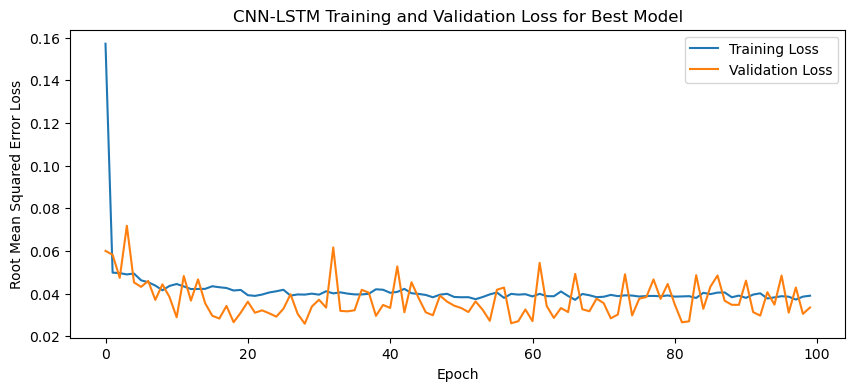

1/1 - 1s - loss: 0.0397 - 1s/epoch - 1s/step
Test Loss: 0.03971869871020317
1/1 [==============================] - 0s 32ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Specific Humidity\tPredicted Specific Humidity\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

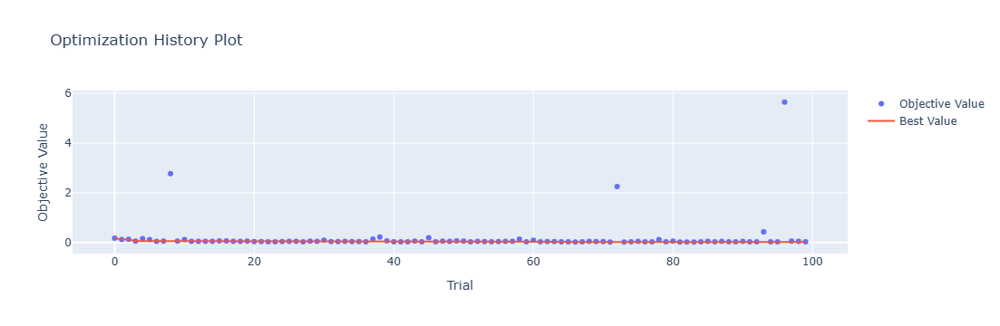

In [4]:
optuna.visualization.plot_optimization_history(study)

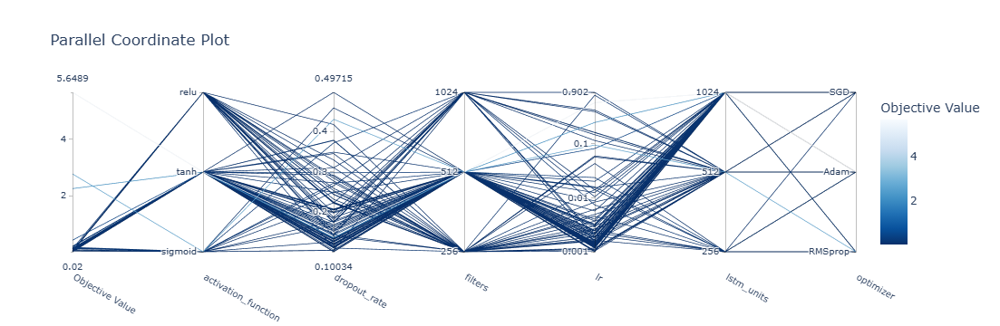

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

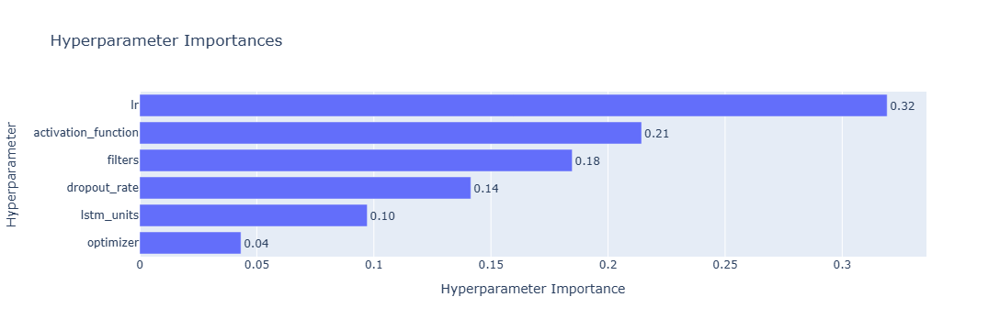

In [6]:
optuna.visualization.plot_param_importances(study)

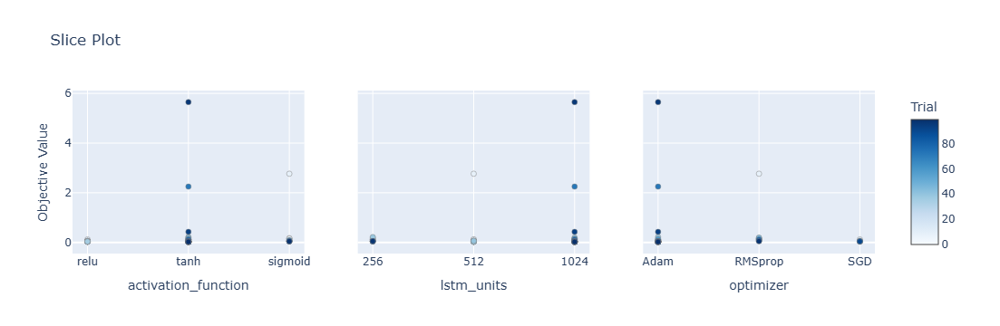

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

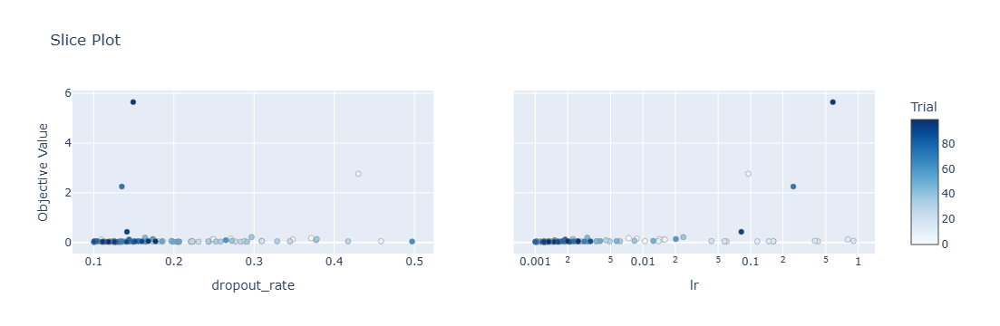

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 21s 134ms/step - loss: 0.1299 - accuracy: 0.6548 - mae: 0.1143 - rmse: 0.1299 - mape: 21.5962 - pearson: 0.5880 - val_loss: 0.0328 - val_accuracy: 0.9000 - val_mae: 0.0300 - val_rmse: 0.0328 - val_mape: 5.8463 - val_pearson: 0.6746
Epoch 2/100
84/84 [==============================] - 9s 111ms/step - loss: 0.0698 - accuracy: 0.8214 - mae: 0.0598 - rmse: 0.0698 - mape: 11.2989 - pearson: 0.7401 - val_loss: 0.0893 - val_accuracy: 0.9000 - val_mae: 0.0631 - val_rmse: 0.0893 - val_mape: 11.7888 - val_pearson: 0.8070
Epoch 3/100
84/84 [==============================] - 10s 120ms/step - loss: 0.0649 - accuracy: 0.8571 - mae: 0.0577 - rmse: 0.0649 - mape: 10.9981 - pearson: 0.7906 - val_loss: 0.0453 - val_accuracy: 0.9000 - val_mae: 0.0360 - val_rmse: 0.0453 - val_mape: 6.8379 - val_pearson: 0.7801
Epoch 4/100
84/84 [==============================] - 12s 140ms/step - loss: 0.0517 - accuracy: 0.8095 - mae: 0.0431 - rmse: 0.0517 - mape: 7.9782

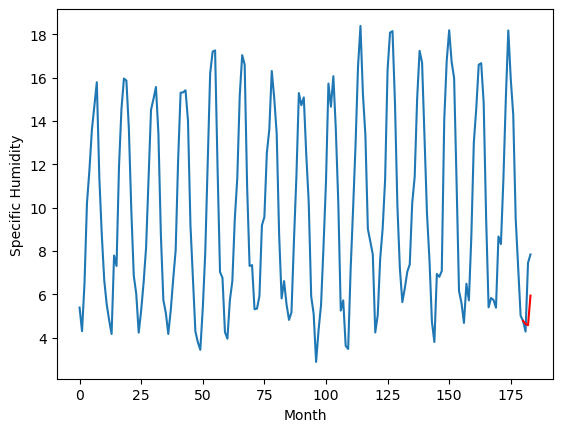

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.32		-0.58
5.61		4.27		-1.34
7.82		5.63		-2.19
[180, 181, 182, 183]
[7.05, 4.322092342376709, 4.265391609817743, 5.6327995277941225]


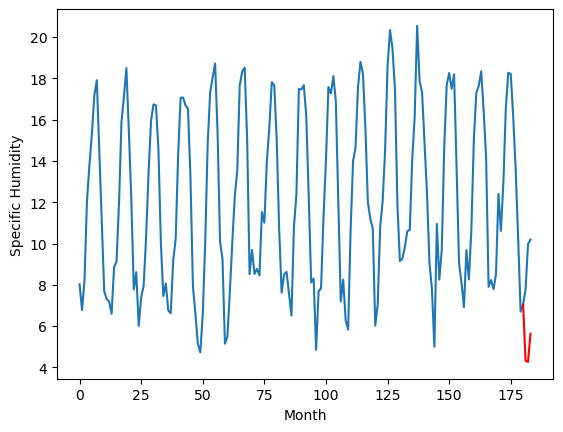

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.21		-0.61
4.97		4.16		-0.81
6.82		5.52		-1.30
[180, 181, 182, 183]
[5.06, 4.212141173481942, 4.155496998280287, 5.522947473973036]


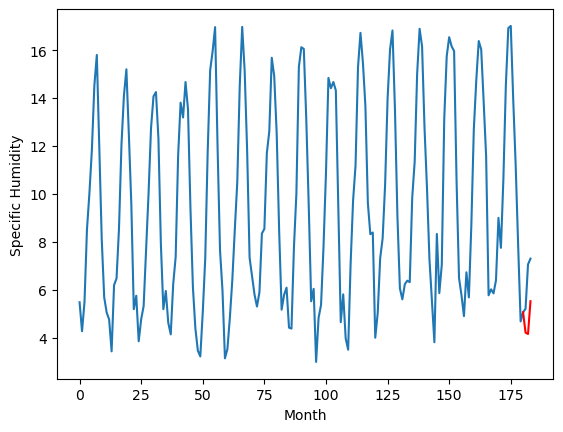

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		3.91		-0.30
4.12		3.86		-0.26
7.57		5.22		-2.35
[180, 181, 182, 183]
[7.05, 3.912060930728912, 3.855326841920614, 5.222706745713949]


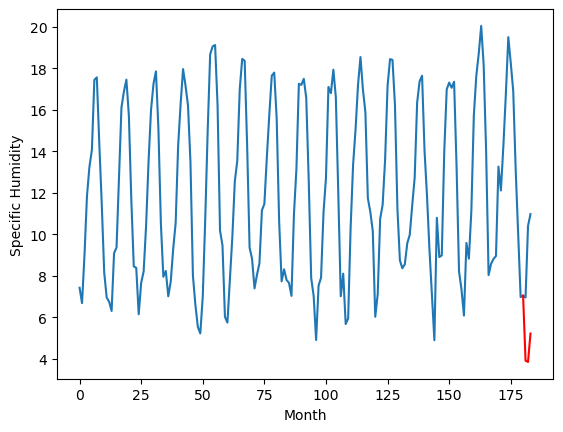

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.16		-0.16
4.92		5.11		0.19
7.76		6.47		-1.29
[180, 181, 182, 183]
[5.2, 5.161972954273224, 5.105138804167509, 6.4724394337832925]


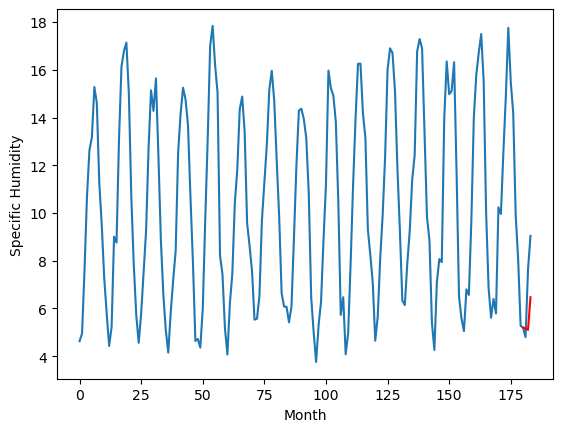

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.80		0.38
8.01		7.75		-0.26
9.58		9.11		-0.47
[180, 181, 182, 183]
[5.16, 7.802152766585349, 7.745519707649946, 9.112981746643781]


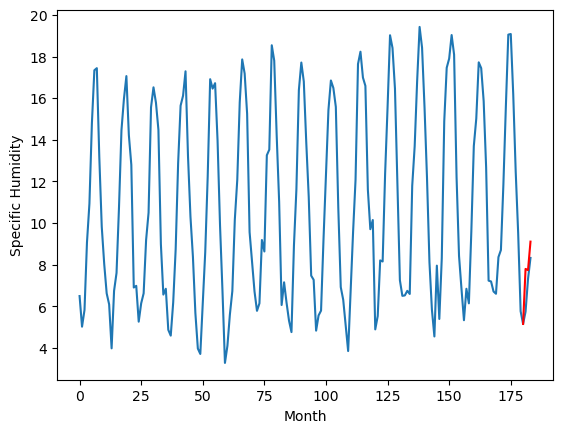

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.25		-0.08
5.38		5.20		-0.18
6.97		6.56		-0.41
[180, 181, 182, 183]
[4.05, 5.25216050028801, 5.195538561344147, 6.563007395267487]


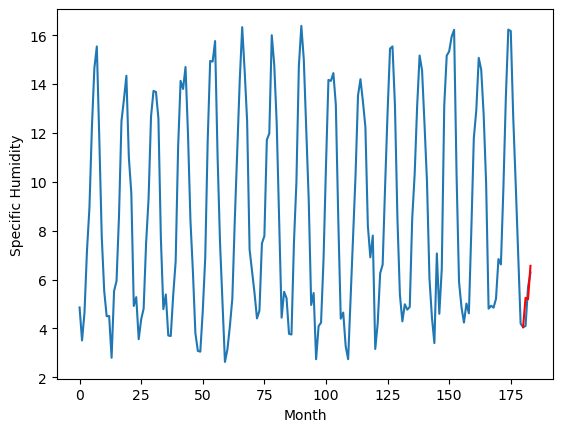

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.20		0.08
7.15		7.15		-0.00
8.77		8.51		-0.26
[180, 181, 182, 183]
[3.64, 7.202188052535057, 7.145596567839384, 8.513091508597135]


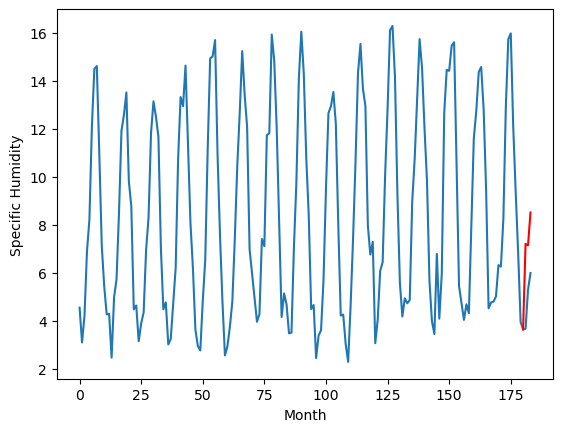

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.40		0.00
3.72		4.35		0.63
6.78		5.71		-1.07
[180, 181, 182, 183]
[3.46, 4.402109746932983, 4.345427383780479, 5.7128507989645]


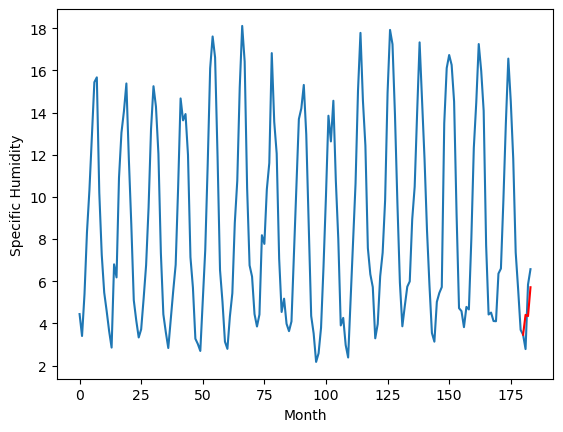

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.27		0.10
5.72		6.22		0.50
7.52		7.58		0.06
[180, 181, 182, 183]
[2.93, 6.272155195474625, 6.215526971966028, 7.582991037517786]


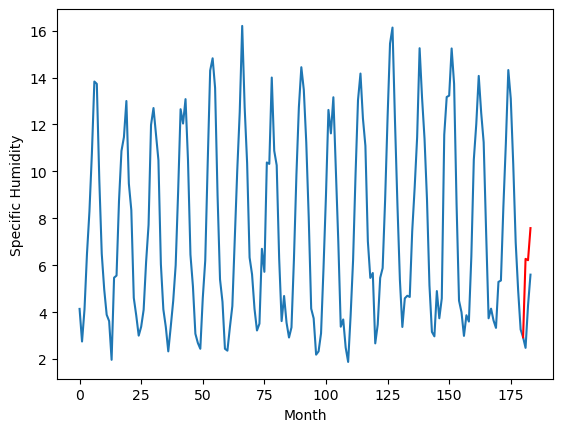

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.63		0.15
3.74		4.58		0.84
5.36		5.94		0.58
[180, 181, 182, 183]
[2.74, 4.632213682532311, 4.5756507149338725, 5.943164967596531]


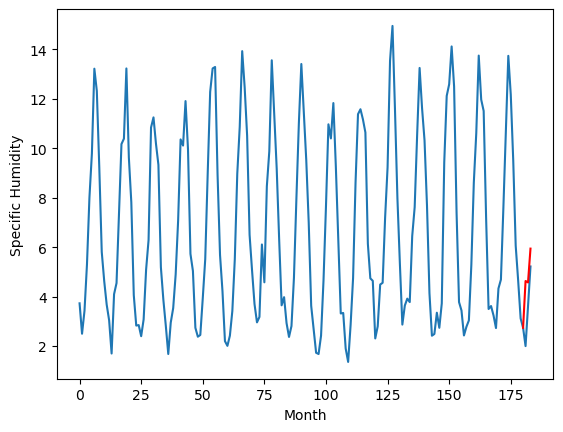

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.632093802690506, 4.322092342376709, 4.212141173481942, 3.912060930728912, 5.161972954273224, 7.802152766585349, 5.25216050028801, 7.202188052535057, 4.402109746932983, 6.272155195474625, 4.632213682532311]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.632094
1                 1    4.90   4.322092
2                 2    4.82   4.212141
3                 3    4.21   3.912061
4                 4    5.32   5.161973
5                 5    7.42   7.802153
6                 6    5.33   5.252161
7                 7    7.12   7.202188
8                 8    4.40   4.402110
9                 9    6.17   6.272155
10               10    4.48   4.632214


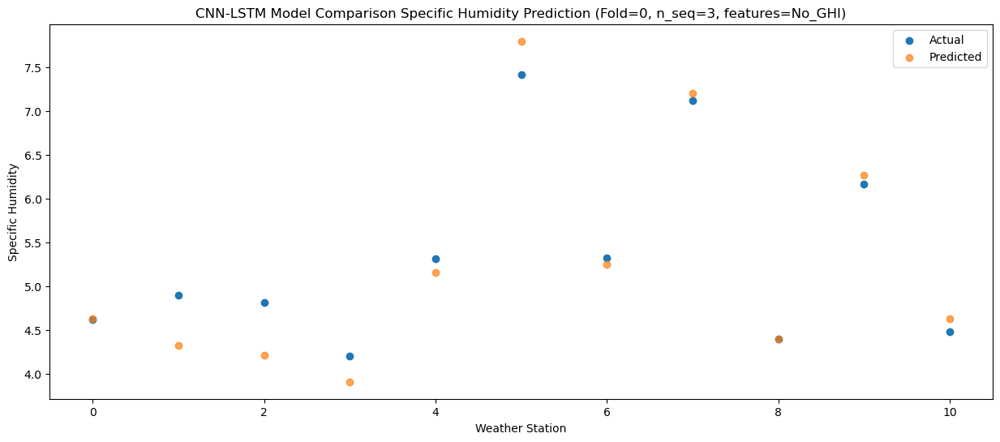

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.575394
1                 1    5.61   4.265392
2                 2    4.97   4.155497
3                 3    4.12   3.855327
4                 4    4.92   5.105139
5                 5    8.01   7.745520
6                 6    5.38   5.195539
7                 7    7.15   7.145597
8                 8    3.72   4.345427
9                 9    5.72   6.215527
10               10    3.74   4.575651


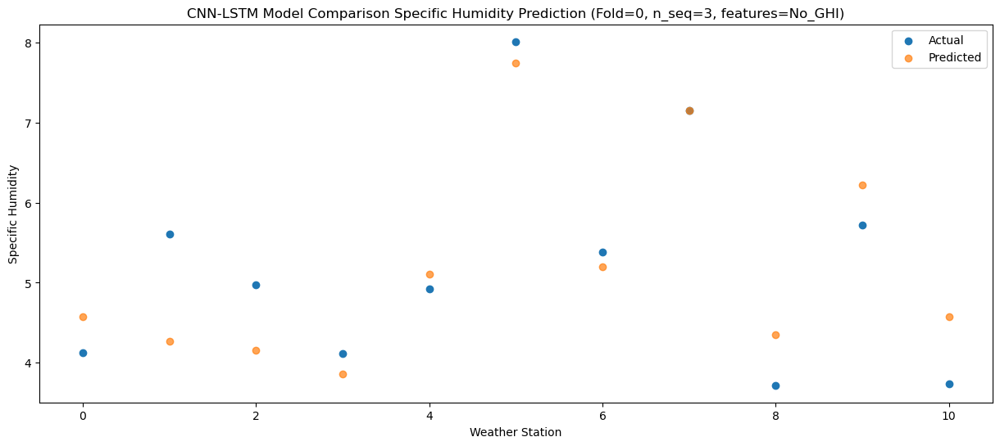

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   5.942803
1                 1    7.82   5.632800
2                 2    6.82   5.522947
3                 3    7.57   5.222707
4                 4    7.76   6.472439
5                 5    9.58   9.112982
6                 6    6.97   6.563007
7                 7    8.77   8.513092
8                 8    6.78   5.712851
9                 9    7.52   7.582991
10               10    5.36   5.943165


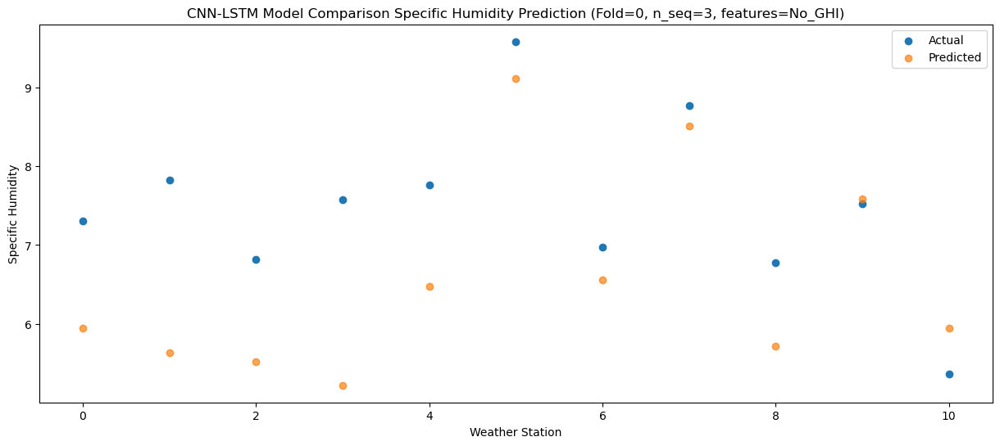

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_15 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_10 (LSTM)              (None, 1, 1024)           6295552   
                                                                 
 dropout_16 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_11 (LSTM)              (None, 1024)              8392704   
                                                      

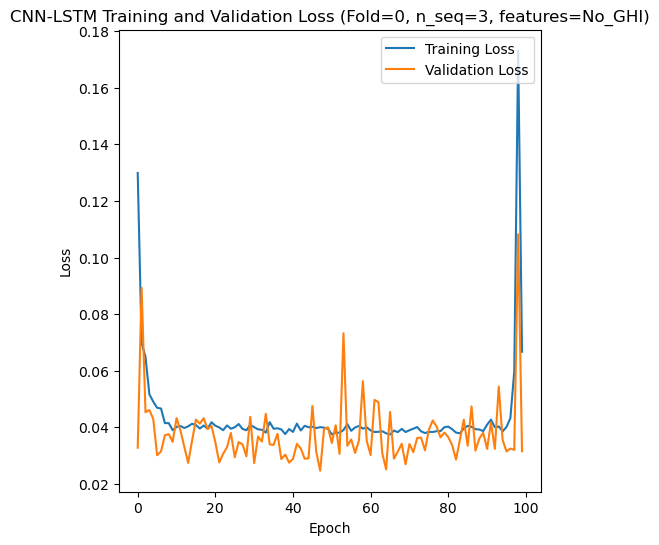

Epoch 1/100
84/84 [==============================] - 26s 163ms/step - loss: 0.1514 - accuracy: 0.6429 - mae: 0.1346 - rmse: 0.1514 - mape: 25.6032 - pearson: 0.6434 - val_loss: 0.0783 - val_accuracy: 0.9000 - val_mae: 0.0681 - val_rmse: 0.0783 - val_mape: 13.0655 - val_pearson: 0.8649
Epoch 2/100
84/84 [==============================] - 13s 151ms/step - loss: 0.0692 - accuracy: 0.7143 - mae: 0.0597 - rmse: 0.0692 - mape: 11.2242 - pearson: 0.6851 - val_loss: 0.0657 - val_accuracy: 0.9000 - val_mae: 0.0601 - val_rmse: 0.0657 - val_mape: 11.5747 - val_pearson: 0.9118
Epoch 3/100
84/84 [==============================] - 13s 150ms/step - loss: 0.0571 - accuracy: 0.8571 - mae: 0.0513 - rmse: 0.0571 - mape: 9.7059 - pearson: 0.7912 - val_loss: 0.0618 - val_accuracy: 0.9000 - val_mae: 0.0507 - val_rmse: 0.0618 - val_mape: 9.6670 - val_pearson: 0.9119
Epoch 4/100
84/84 [==============================] - 13s 149ms/step - loss: 0.0533 - accuracy: 0.8571 - mae: 0.0450 - rmse: 0.0533 - mape: 8.438

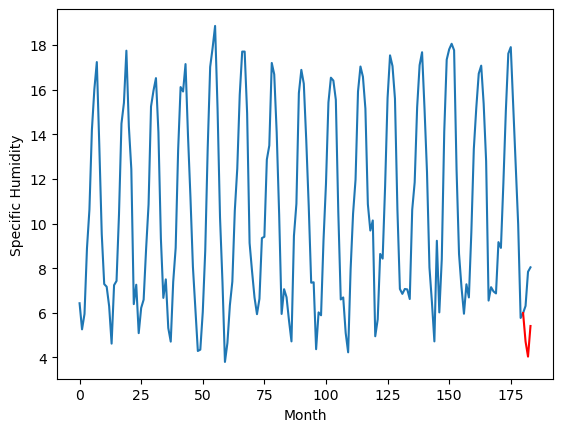

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.22		-0.12
4.53		3.55		-0.98
6.06		4.92		-1.14
[180, 181, 182, 183]
[4.15, 4.2235435244441035, 3.5481544730067256, 4.920398235023022]


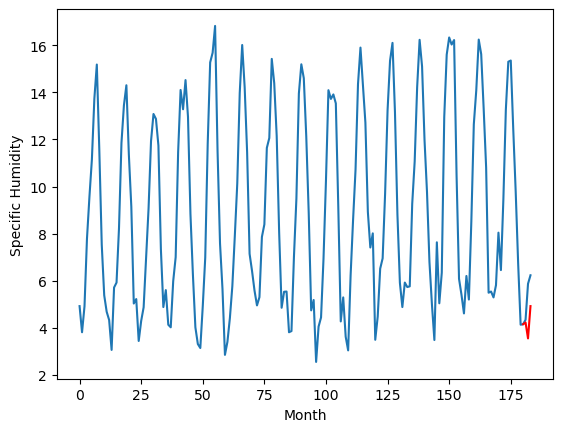

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.97		-0.25
3.22		2.30		-0.92
5.84		3.67		-2.17
[180, 181, 182, 183]
[5.12, 2.973543524444103, 2.298154473006725, 3.6703982350230215]


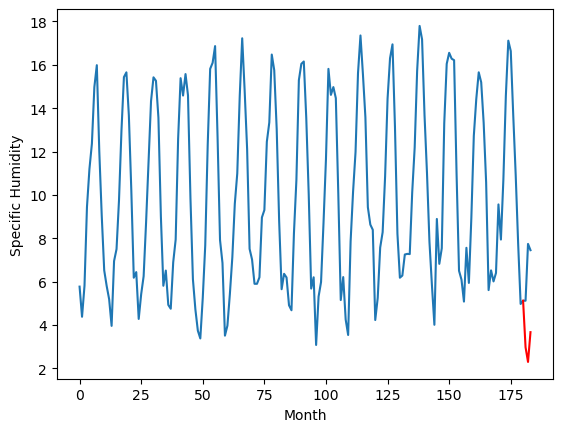

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.27		0.24
2.10		1.60		-0.50
4.74		2.97		-1.77
[180, 181, 182, 183]
[6.35, 2.2735435244441033, 1.5981544730067254, 2.970398235023022]


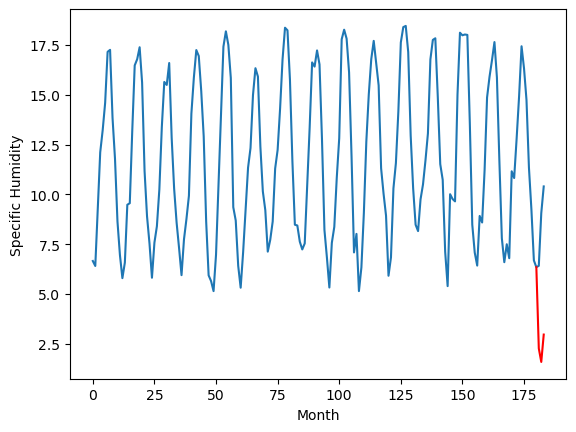

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.33		0.15
6.22		5.66		-0.56
8.94		7.03		-1.91
[180, 181, 182, 183]
[6.08, 6.333543524444103, 5.658154473006725, 7.030398235023021]


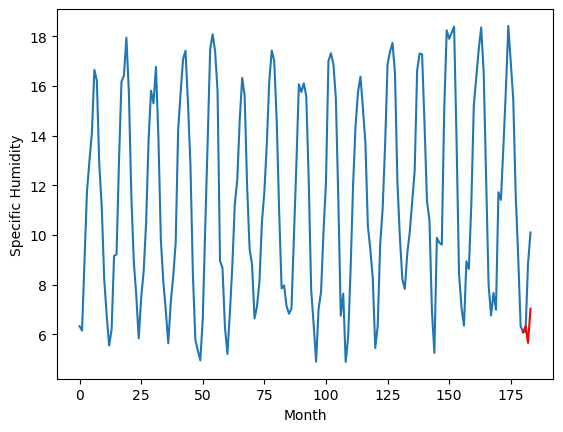

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.82		-0.93
5.12		4.15		-0.97
5.91		5.52		-0.39
[180, 181, 182, 183]
[3.92, 4.823543524444103, 4.148154473006725, 5.520398235023022]


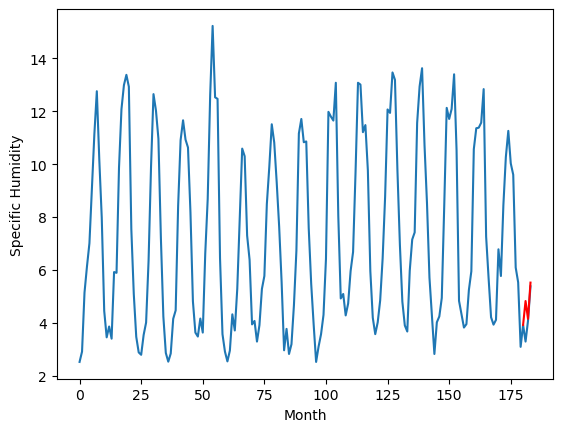

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.67		0.01
5.78		5.00		-0.78
7.34		6.37		-0.97
[180, 181, 182, 183]
[4.16, 5.673543524444103, 4.998154473006725, 6.370398235023021]


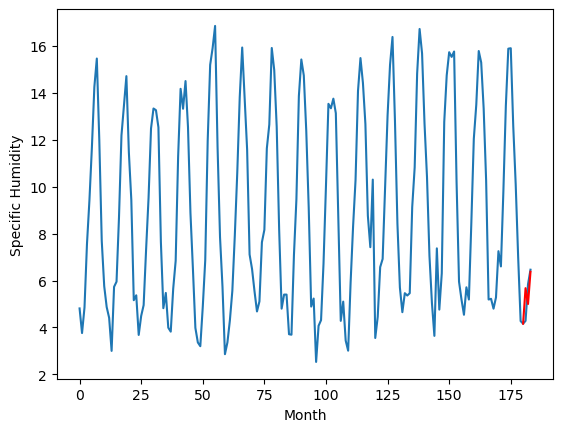

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.56		0.03
6.01		5.89		-0.12
8.74		7.26		-1.48
[180, 181, 182, 183]
[3.84, 6.563543524444103, 5.8881544730067255, 7.260398235023022]


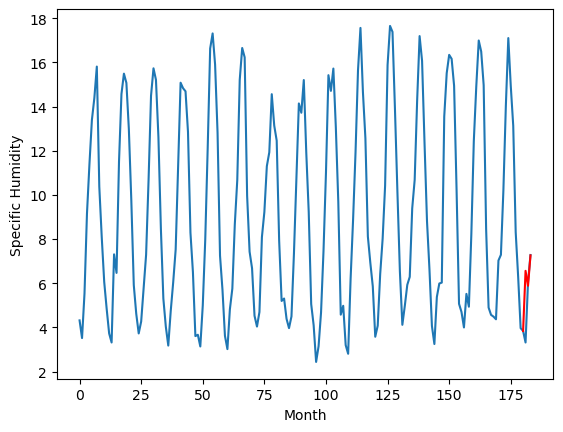

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.23		-0.26
5.68		5.56		-0.12
8.29		6.93		-1.36
[180, 181, 182, 183]
[3.73, 6.233543524444103, 5.558154473006725, 6.930398235023022]


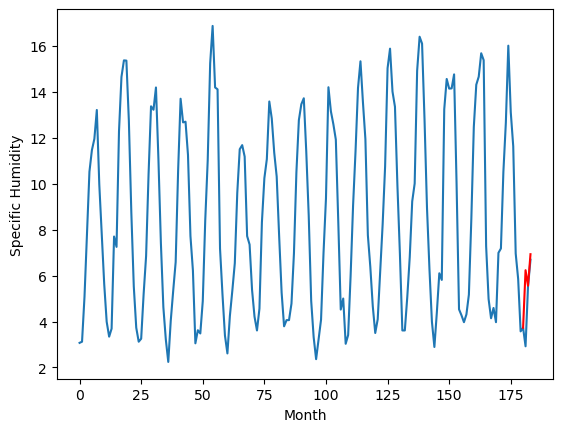

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.42		-0.29
1.97		1.75		-0.22
3.79		3.12		-0.67
[180, 181, 182, 183]
[2.83, 2.4235435244441033, 1.7481544730067253, 3.1203982350230217]


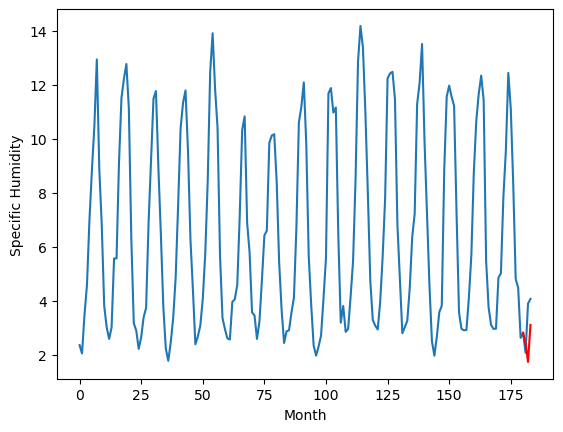

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.71		0.63
4.12		4.04		-0.08
5.36		5.41		0.05
[180, 181, 182, 183]
[2.69, 4.713543524444103, 4.038154473006725, 5.410398235023021]


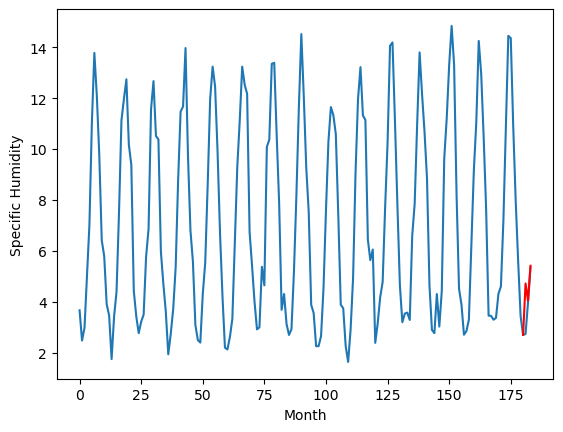

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.713543524444103, 4.2235435244441035, 2.973543524444103, 2.2735435244441033, 6.333543524444103, 4.823543524444103, 5.673543524444103, 6.563543524444103, 6.233543524444103, 2.4235435244441033, 4.713543524444103]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.713544
1                 1    4.34   4.223544
2                 2    3.22   2.973544
3                 3    2.03   2.273544
4                 4    6.18   6.333544
5                 5    5.75   4.823544
6                 6    5.66   5.673544
7                 7    6.53   6.563544
8                 8    6.49   6.233544
9                 9    2.71   2.423544
10               10    4.08   4.713544


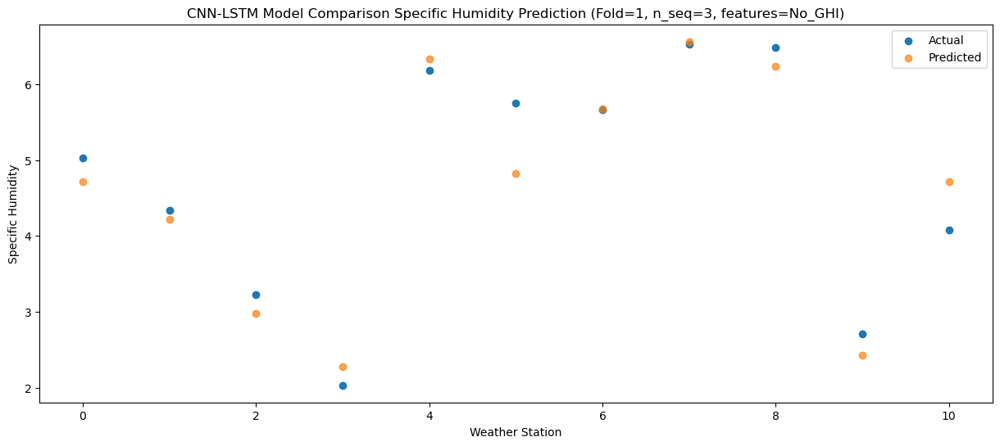

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.038154
1                 1    4.53   3.548154
2                 2    3.22   2.298154
3                 3    2.10   1.598154
4                 4    6.22   5.658154
5                 5    5.12   4.148154
6                 6    5.78   4.998154
7                 7    6.01   5.888154
8                 8    5.68   5.558154
9                 9    1.97   1.748154
10               10    4.12   4.038154


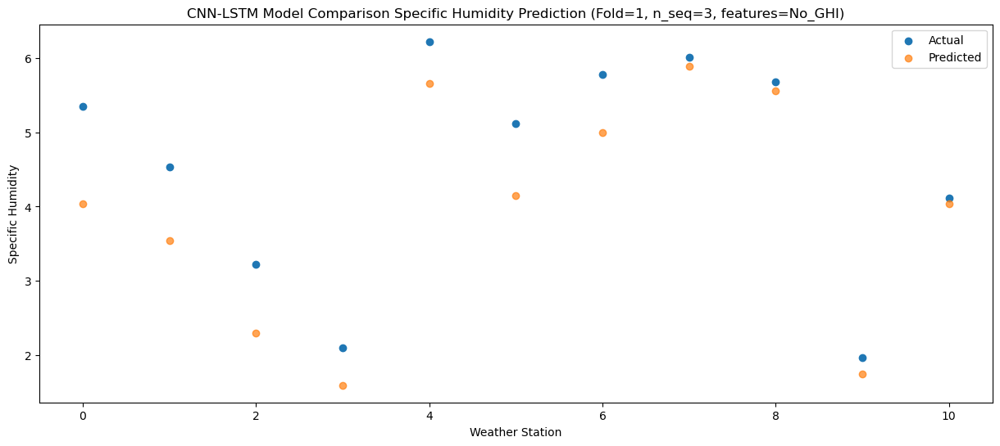

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   5.410398
1                 1    6.06   4.920398
2                 2    5.84   3.670398
3                 3    4.74   2.970398
4                 4    8.94   7.030398
5                 5    5.91   5.520398
6                 6    7.34   6.370398
7                 7    8.74   7.260398
8                 8    8.29   6.930398
9                 9    3.79   3.120398
10               10    5.36   5.410398


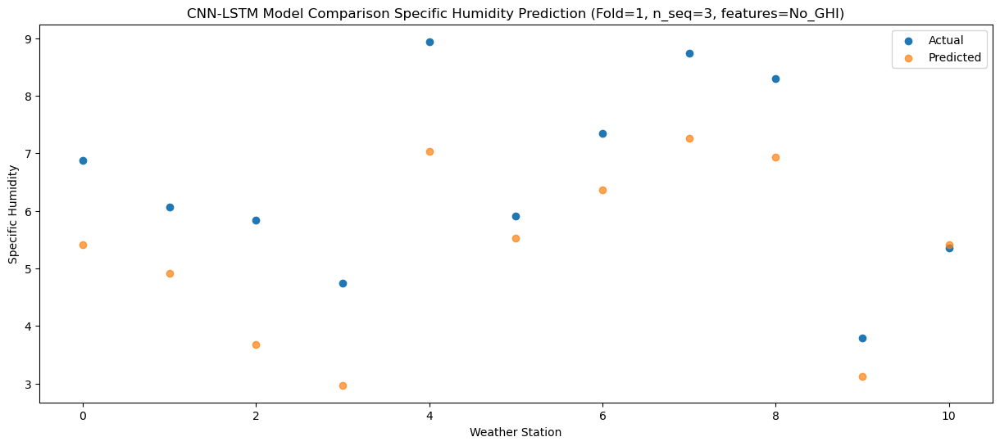

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_18 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_12 (LSTM)              (None, 1, 1024)           6295552   
                                                                 
 dropout_19 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_13 (LSTM)              (None, 1024)              8392704   
                                                      

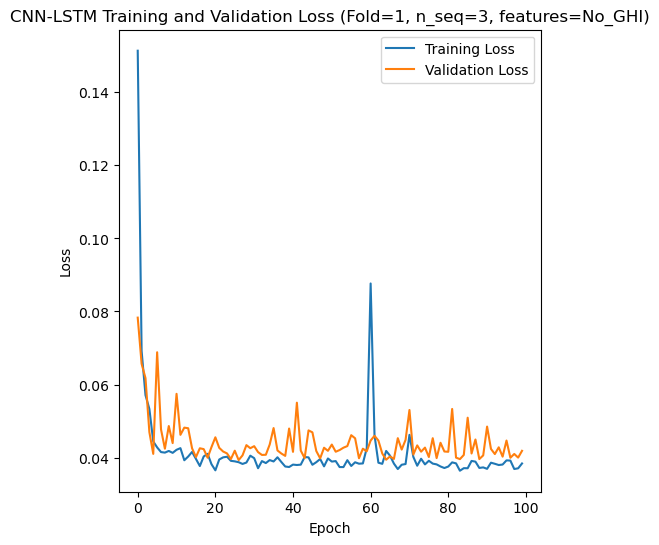

Epoch 1/100
84/84 [==============================] - 27s 179ms/step - loss: 0.1270 - accuracy: 0.6429 - mae: 0.1128 - rmse: 0.1270 - mape: 21.3937 - pearson: 0.6249 - val_loss: 0.0738 - val_accuracy: 1.0000 - val_mae: 0.0597 - val_rmse: 0.0738 - val_mape: 11.9359 - val_pearson: 0.8106
Epoch 2/100
84/84 [==============================] - 11s 135ms/step - loss: 0.0785 - accuracy: 0.7619 - mae: 0.0674 - rmse: 0.0785 - mape: 12.7487 - pearson: 0.6916 - val_loss: 0.0430 - val_accuracy: 1.0000 - val_mae: 0.0381 - val_rmse: 0.0430 - val_mape: 7.1957 - val_pearson: 0.9300
Epoch 3/100
84/84 [==============================] - 12s 144ms/step - loss: 0.0592 - accuracy: 0.8095 - mae: 0.0506 - rmse: 0.0592 - mape: 9.5309 - pearson: 0.6827 - val_loss: 0.0311 - val_accuracy: 1.0000 - val_mae: 0.0284 - val_rmse: 0.0311 - val_mape: 5.5470 - val_pearson: 0.9100
Epoch 4/100
84/84 [==============================] - 12s 148ms/step - loss: 0.0475 - accuracy: 0.8810 - mae: 0.0417 - rmse: 0.0475 - mape: 7.8506

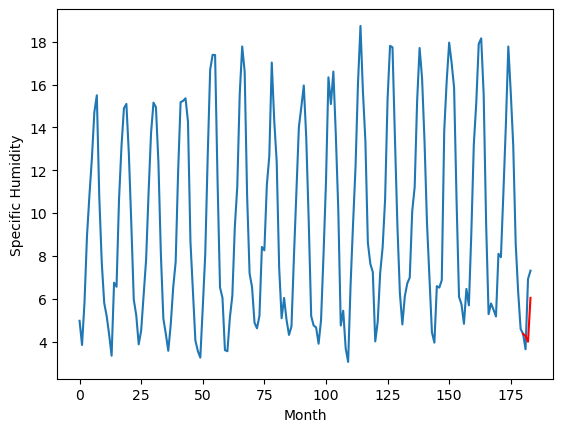

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.53		-0.31
1.16		1.26		0.10
3.01		3.31		0.30
[180, 181, 182, 183]
[2.82, 1.5260244452953338, 1.2630126321315764, 3.3120694005489346]


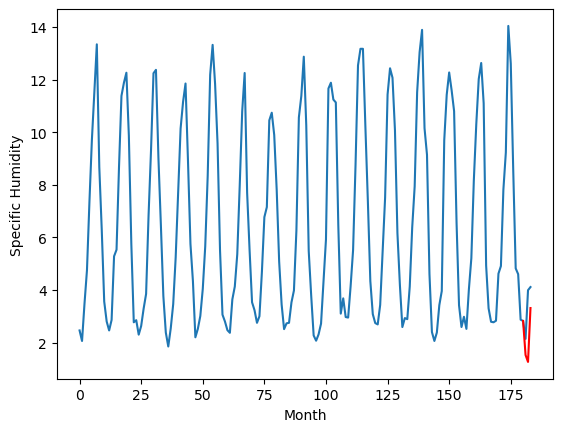

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.68		-0.85
7.66		4.41		-3.25
7.88		6.46		-1.42
[180, 181, 182, 183]
[9.16, 4.676024445295334, 4.413012632131577, 6.462069400548935]


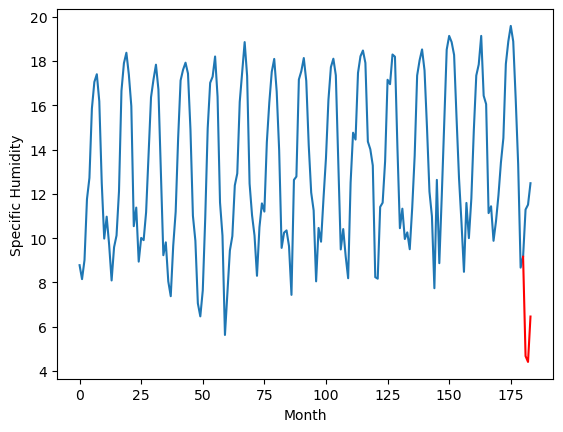

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.70		0.72
4.15		4.43		0.28
4.79		6.48		1.69
[180, 181, 182, 183]
[2.44, 4.696023968458175, 4.433012155294418, 6.482068923711776]


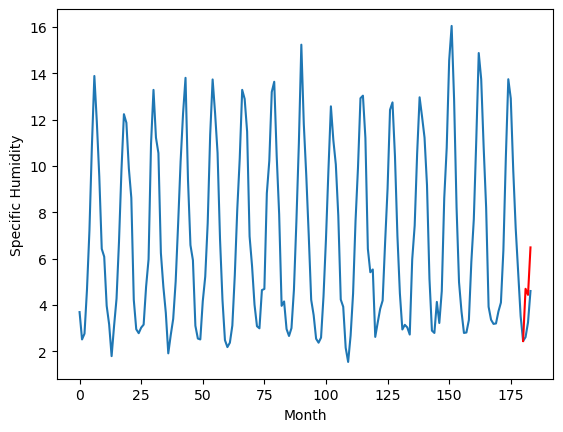

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.61		-0.49
5.08		4.34		-0.74
8.37		6.39		-1.98
[180, 181, 182, 183]
[6.65, 4.606024445295334, 4.343012632131576, 6.392069400548935]


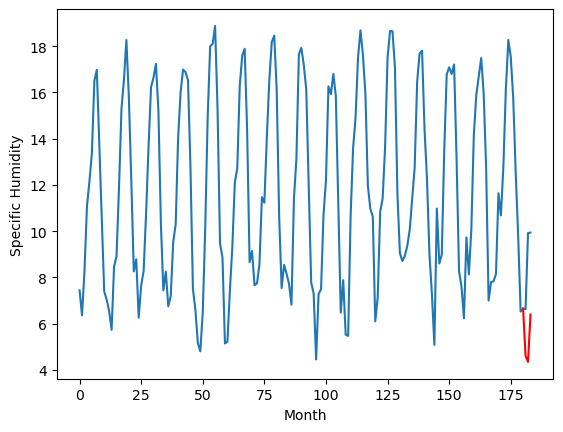

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.10		-0.23
2.28		1.83		-0.45
5.27		3.88		-1.39
[180, 181, 182, 183]
[6.19, 2.096024445295334, 1.8330126321315765, 3.882069400548935]


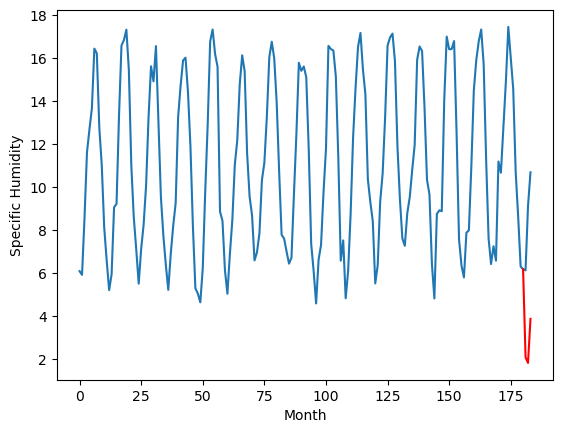

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.42		-0.26
8.35		8.15		-0.20
11.21		10.20		-1.01
[180, 181, 182, 183]
[4.78, 8.416024445295333, 8.153012632131576, 10.202069400548934]


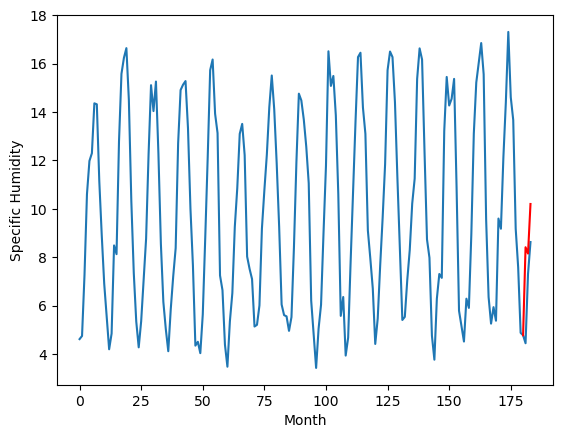

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.33		-0.64
3.84		3.06		-0.78
3.93		5.11		1.18
[180, 181, 182, 183]
[2.61, 3.326024445295334, 3.0630126321315765, 5.112069400548934]


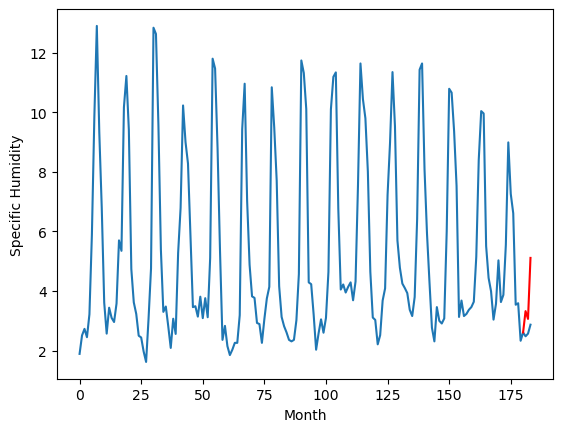

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.08		-1.21
8.82		6.81		-2.01
8.93		8.86		-0.07
[180, 181, 182, 183]
[4.6, 7.076024445295334, 6.813012632131577, 8.862069400548936]


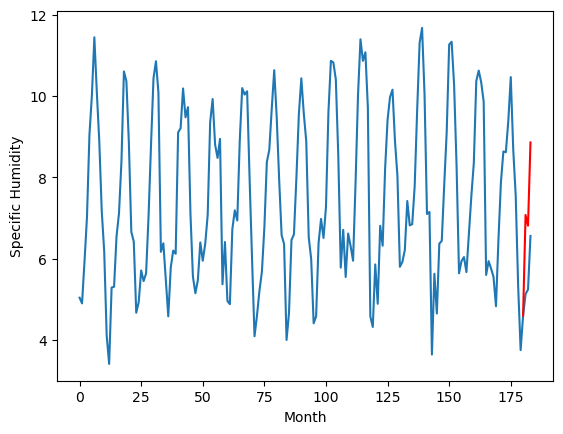

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.74		-0.24
6.05		5.47		-0.58
7.78		7.52		-0.26
[180, 181, 182, 183]
[4.27, 5.7360244452953335, 5.473012632131576, 7.522069400548935]


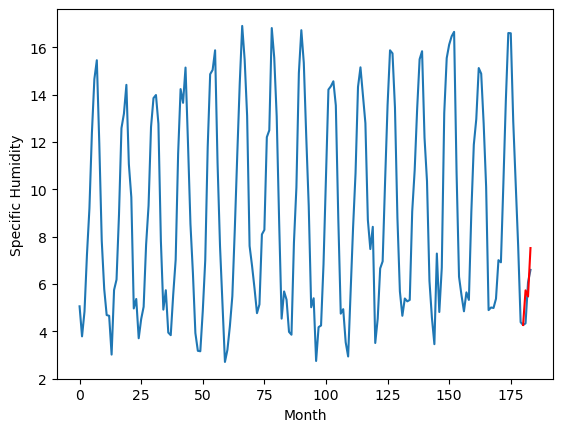

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.26		-0.37
4.87		3.99		-0.88
5.90		6.04		0.14
[180, 181, 182, 183]
[3.91, 4.256024445295334, 3.9930126321315766, 6.042069400548935]


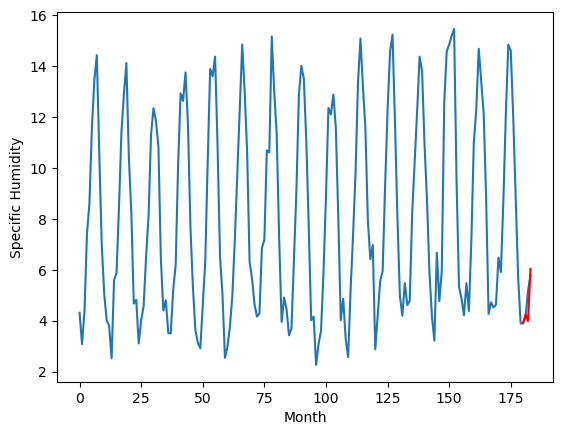

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.256024445295334, 1.5260244452953338, 4.676024445295334, 4.696023968458175, 4.606024445295334, 2.096024445295334, 8.416024445295333, 3.326024445295334, 7.076024445295334, 5.7360244452953335, 4.256024445295334]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.256024
1                 1    1.84   1.526024
2                 2    5.53   4.676024
3                 3    3.98   4.696024
4                 4    5.10   4.606024
5                 5    2.33   2.096024
6                 6    8.68   8.416024
7                 7    3.97   3.326024
8                 8    8.29   7.076024
9                 9    5.98   5.736024
10               10    4.63   4.256024


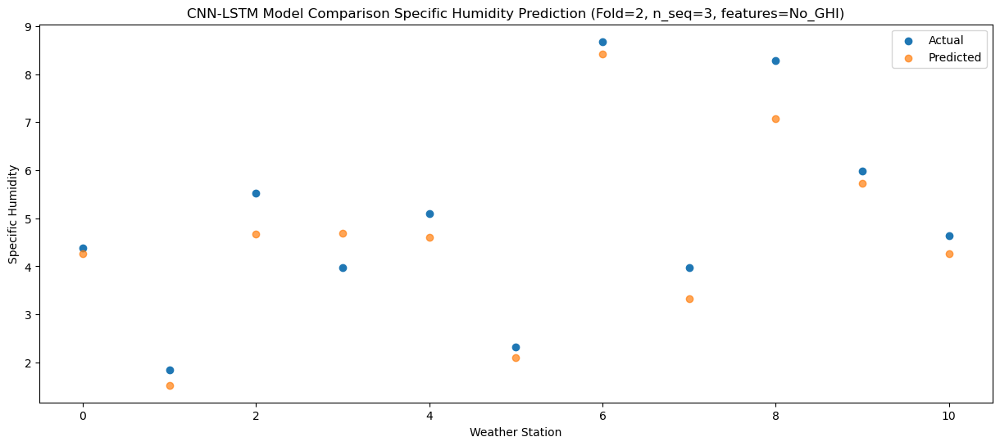

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.993013
1                 1    1.16   1.263013
2                 2    7.66   4.413013
3                 3    4.15   4.433012
4                 4    5.08   4.343013
5                 5    2.28   1.833013
6                 6    8.35   8.153013
7                 7    3.84   3.063013
8                 8    8.82   6.813013
9                 9    6.05   5.473013
10               10    4.87   3.993013


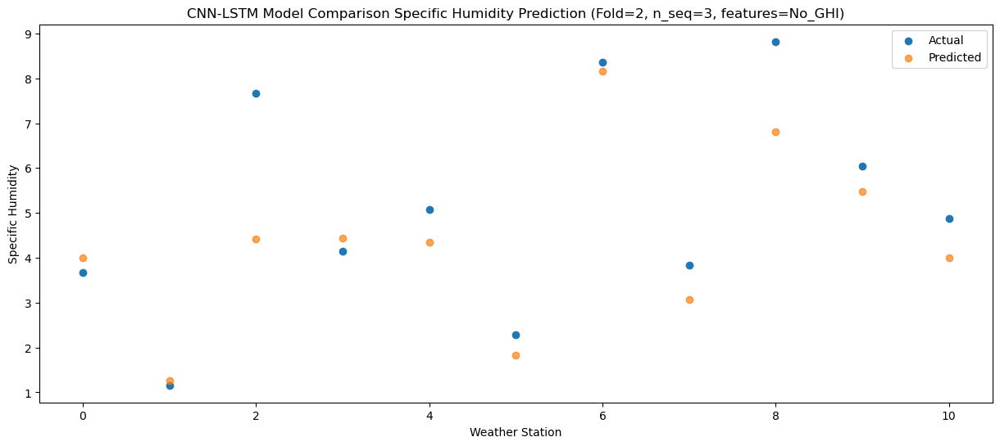

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.042069
1                 1    3.01   3.312069
2                 2    7.88   6.462069
3                 3    4.79   6.482069
4                 4    8.37   6.392069
5                 5    5.27   3.882069
6                 6   11.21  10.202069
7                 7    3.93   5.112069
8                 8    8.93   8.862069
9                 9    7.78   7.522069
10               10    5.90   6.042069


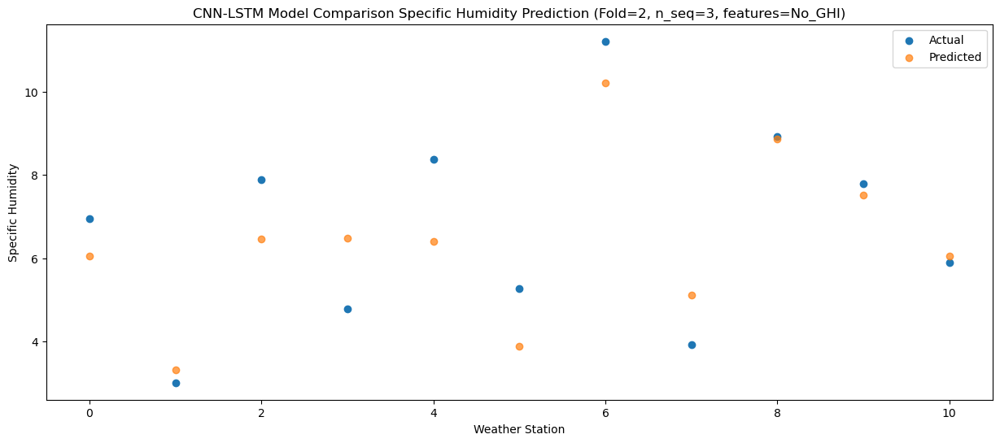

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_21 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_14 (LSTM)              (None, 1, 1024)           6295552   
                                                                 
 dropout_22 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_15 (LSTM)              (None, 1024)              8392704   
                                                      

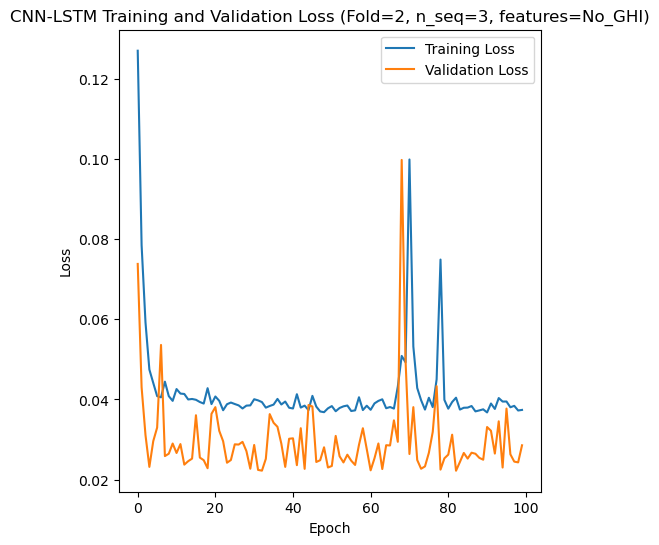

Epoch 1/100
84/84 [==============================] - 28s 222ms/step - loss: 0.1299 - accuracy: 0.6429 - mae: 0.1170 - rmse: 0.1299 - mape: 22.4280 - pearson: 0.5977 - val_loss: 0.0935 - val_accuracy: 0.8000 - val_mae: 0.0788 - val_rmse: 0.0935 - val_mape: 14.4049 - val_pearson: 0.4002
Epoch 2/100
84/84 [==============================] - 14s 162ms/step - loss: 0.0802 - accuracy: 0.7857 - mae: 0.0698 - rmse: 0.0802 - mape: 13.0631 - pearson: 0.6784 - val_loss: 0.0672 - val_accuracy: 0.8000 - val_mae: 0.0572 - val_rmse: 0.0672 - val_mape: 11.7511 - val_pearson: 0.2632
Epoch 3/100
84/84 [==============================] - 15s 176ms/step - loss: 0.0592 - accuracy: 0.8810 - mae: 0.0505 - rmse: 0.0592 - mape: 9.5756 - pearson: 0.7441 - val_loss: 0.0341 - val_accuracy: 0.8000 - val_mae: 0.0297 - val_rmse: 0.0341 - val_mape: 5.6447 - val_pearson: 0.8473
Epoch 4/100
84/84 [==============================] - 13s 160ms/step - loss: 0.0479 - accuracy: 0.9048 - mae: 0.0409 - rmse: 0.0479 - mape: 7.636

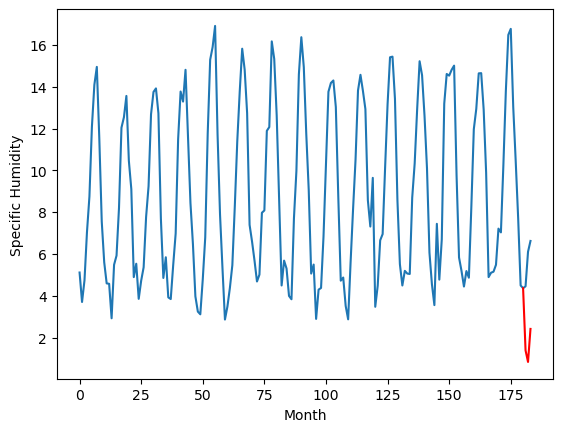

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.42		-0.22
2.08		1.87		-0.21
4.59		3.45		-1.14
[180, 181, 182, 183]
[3.43, 2.4225639510154724, 1.8717855620384216, 3.4513143706321716]


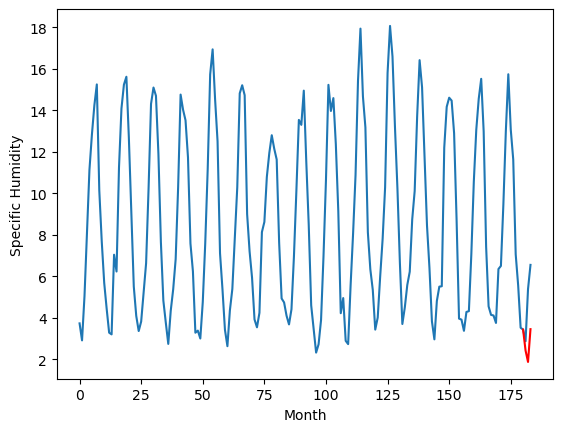

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.62		-0.75
6.31		5.07		-1.24
6.39		6.65		0.26
[180, 181, 182, 183]
[5.43, 5.622563951015472, 5.071785562038421, 6.651314370632171]


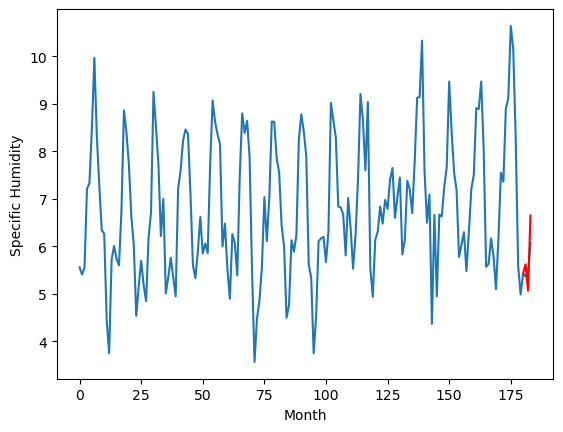

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.40		-0.04
3.37		2.85		-0.52
4.67		4.43		-0.24
[180, 181, 182, 183]
[3.21, 3.402563474178314, 2.8517850852012634, 4.431313893795013]


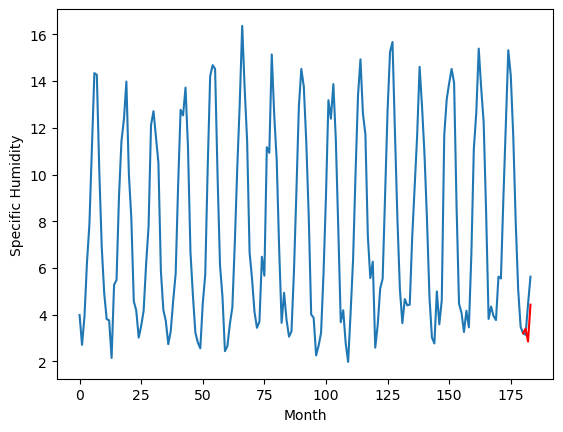

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.80		-0.11
4.08		4.25		0.17
6.56		5.83		-0.73
[180, 181, 182, 183]
[3.04, 4.8025634741783145, 4.251785085201264, 5.831313893795014]


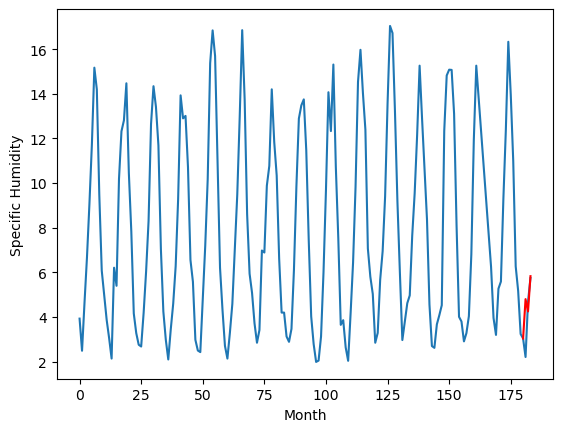

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.42		0.00
2.90		2.87		-0.03
4.93		4.45		-0.48
[180, 181, 182, 183]
[2.91, 3.4225639510154724, 2.8717855620384216, 4.451314370632172]


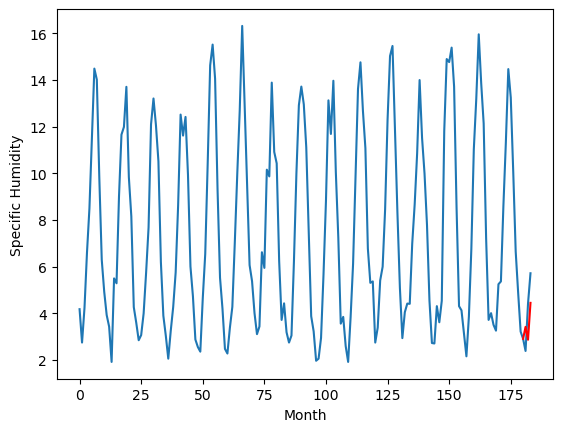

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.25		-0.48
5.79		4.70		-1.09
6.10		6.28		0.18
[180, 181, 182, 183]
[1.6, 5.252563951015472, 4.701785562038421, 6.281314370632171]


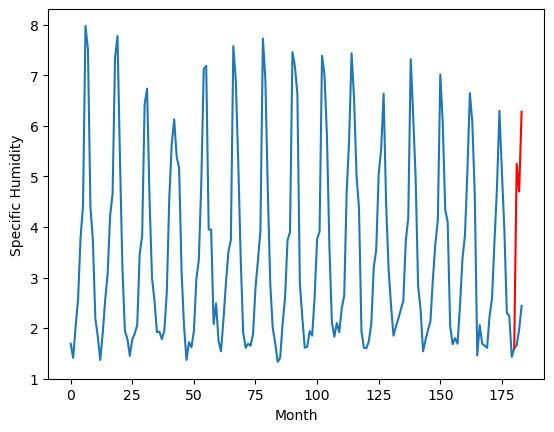

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.68		-1.12
4.32		3.13		-1.19
4.62		4.71		0.09
[180, 181, 182, 183]
[2.86, 3.6825639510154726, 3.131785562038422, 4.711314370632172]


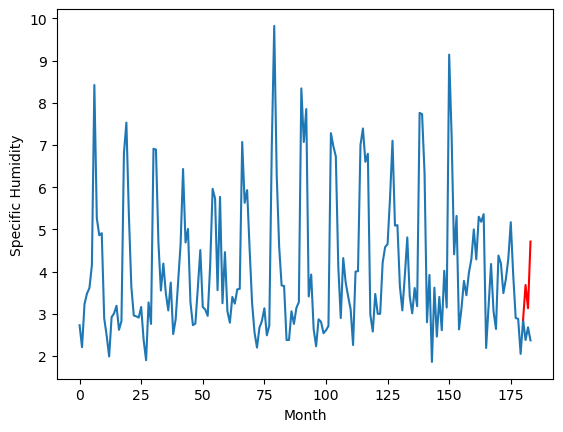

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.62		-0.98
4.25		3.07		-1.18
3.90		4.65		0.75
[180, 181, 182, 183]
[5.65, 3.6225639510154726, 3.071785562038422, 4.651314370632171]


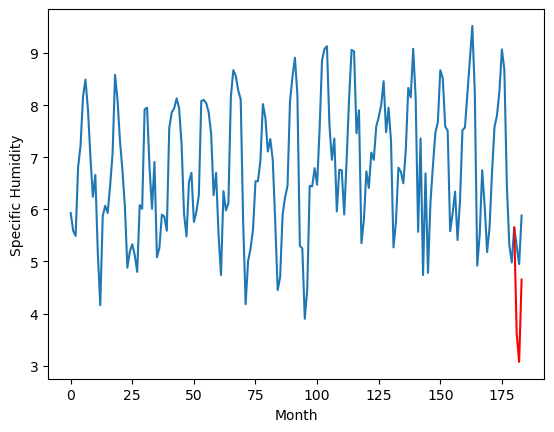

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.87		0.78
3.24		3.32		0.08
4.02		4.90		0.88
[180, 181, 182, 183]
[2.54, 3.872563951015472, 3.3217855620384213, 4.901315324306488]


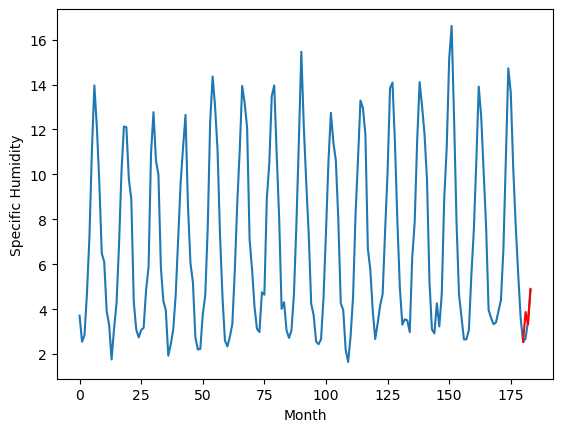

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.38		0.38
0.86		0.83		-0.03
2.14		2.41		0.27
[180, 181, 182, 183]
[2.51, 1.3825639510154724, 0.8317855620384216, 2.4113143706321716]


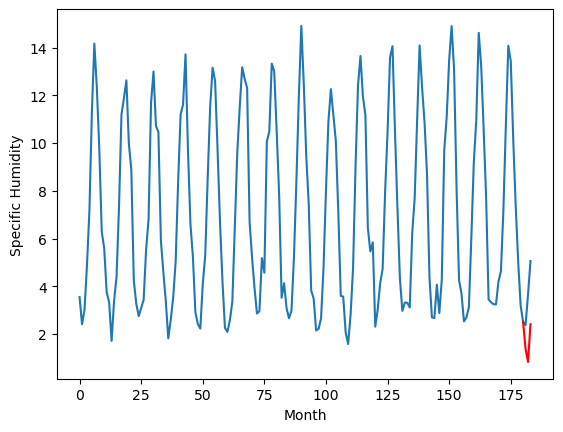

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.3825639510154724, 2.4225639510154724, 5.622563951015472, 3.402563474178314, 4.8025634741783145, 3.4225639510154724, 5.252563951015472, 3.6825639510154726, 3.6225639510154726, 3.872563951015472, 1.3825639510154724]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.382564
1                 1    2.64   2.422564
2                 2    6.37   5.622564
3                 3    3.44   3.402563
4                 4    4.91   4.802563
5                 5    3.42   3.422564
6                 6    5.73   5.252564
7                 7    4.80   3.682564
8                 8    4.60   3.622564
9                 9    3.09   3.872564
10               10    1.00   1.382564


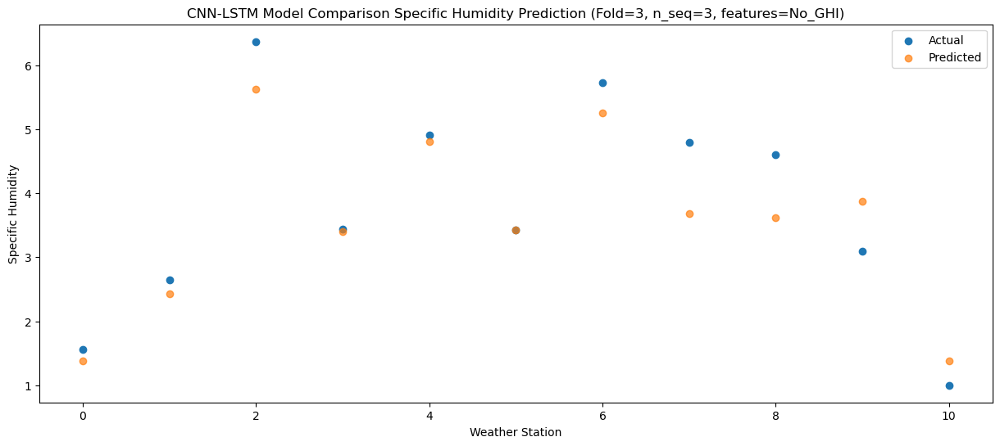

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   0.831786
1                 1    2.08   1.871786
2                 2    6.31   5.071786
3                 3    3.37   2.851785
4                 4    4.08   4.251785
5                 5    2.90   2.871786
6                 6    5.79   4.701786
7                 7    4.32   3.131786
8                 8    4.25   3.071786
9                 9    3.24   3.321786
10               10    0.86   0.831786


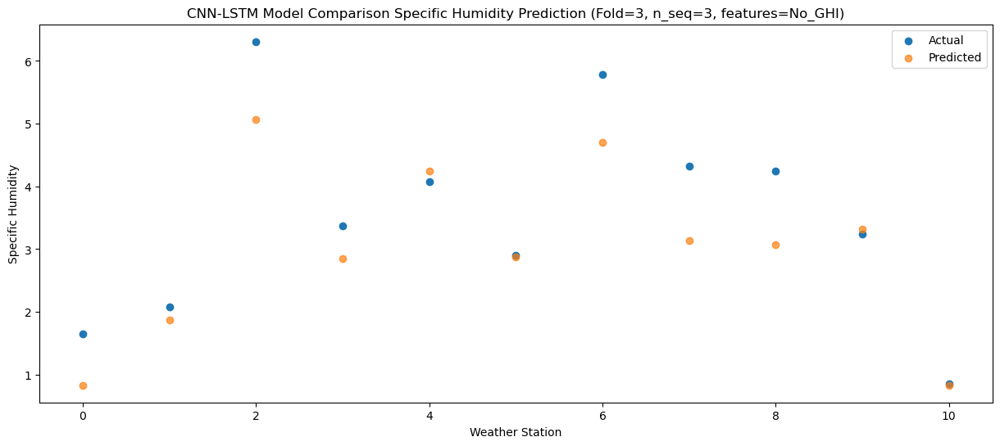

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   2.411314
1                 1    4.59   3.451314
2                 2    6.39   6.651314
3                 3    4.67   4.431314
4                 4    6.56   5.831314
5                 5    4.93   4.451314
6                 6    6.10   6.281314
7                 7    4.62   4.711314
8                 8    3.90   4.651314
9                 9    4.02   4.901315
10               10    2.14   2.411314


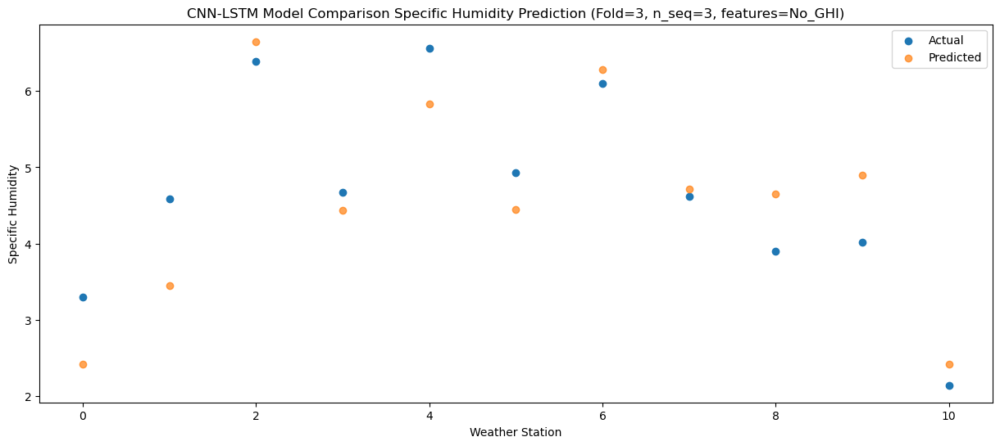

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_24 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_16 (LSTM)              (None, 1, 1024)           6295552   
                                                                 
 dropout_25 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_17 (LSTM)              (None, 1024)              8392704   
                                                      

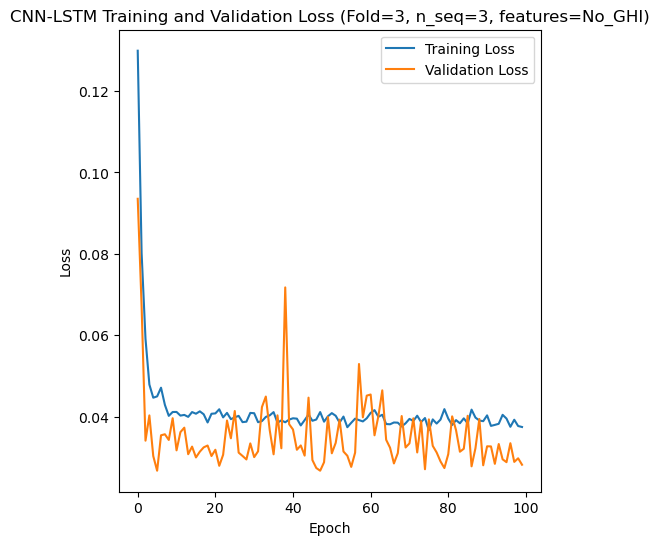

Epoch 1/100
84/84 [==============================] - 34s 222ms/step - loss: 0.1453 - accuracy: 0.6429 - mae: 0.1287 - rmse: 0.1453 - mape: 24.7008 - pearson: 0.5720 - val_loss: 0.0568 - val_accuracy: 0.9000 - val_mae: 0.0500 - val_rmse: 0.0568 - val_mape: 9.7884 - val_pearson: 0.5227
Epoch 2/100
84/84 [==============================] - 15s 179ms/step - loss: 0.0652 - accuracy: 0.7500 - mae: 0.0565 - rmse: 0.0652 - mape: 10.5397 - pearson: 0.7046 - val_loss: 0.0371 - val_accuracy: 0.9000 - val_mae: 0.0337 - val_rmse: 0.0371 - val_mape: 6.4662 - val_pearson: 0.7146
Epoch 3/100
84/84 [==============================] - 15s 175ms/step - loss: 0.0613 - accuracy: 0.8690 - mae: 0.0532 - rmse: 0.0613 - mape: 10.0472 - pearson: 0.7829 - val_loss: 0.0425 - val_accuracy: 0.9000 - val_mae: 0.0370 - val_rmse: 0.0425 - val_mape: 7.1931 - val_pearson: 0.6700
Epoch 4/100
84/84 [==============================] - 15s 177ms/step - loss: 0.0510 - accuracy: 0.8690 - mae: 0.0444 - rmse: 0.0510 - mape: 8.3816

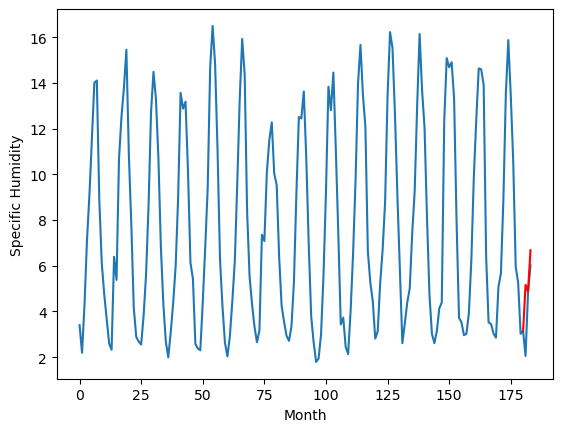

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.87		-0.40
6.26		3.57		-2.69
6.23		5.38		-0.85
[180, 181, 182, 183]
[7.79, 3.8656340596079826, 3.5731232818961143, 5.380923098027706]


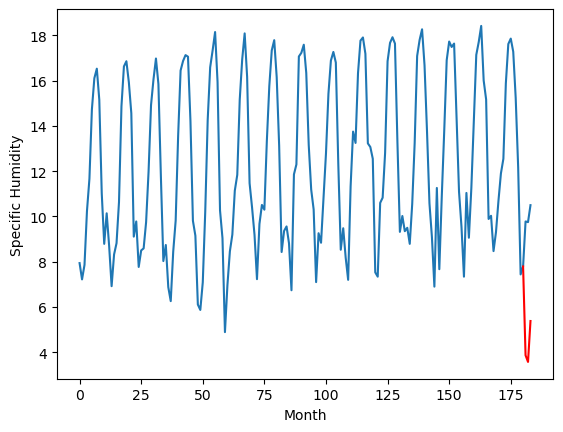

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.93		0.06
3.75		3.63		-0.12
6.81		5.44		-1.37
[180, 181, 182, 183]
[5.03, 3.9256272907555103, 3.6331324572861194, 5.4409952159225945]


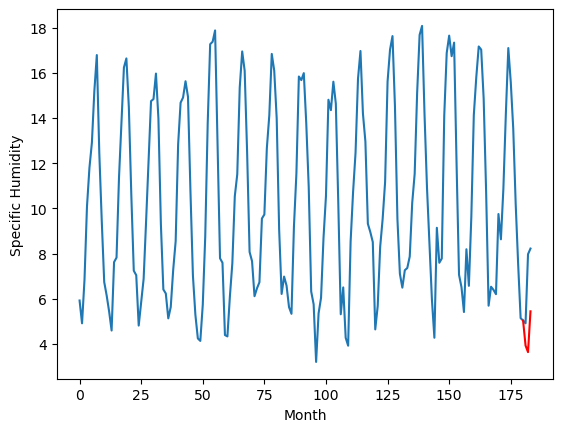

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.79		0.06
3.41		3.49		0.08
6.07		5.30		-0.77
[180, 181, 182, 183]
[4.41, 3.78563502445817, 3.4931373001635073, 5.30100578084588]


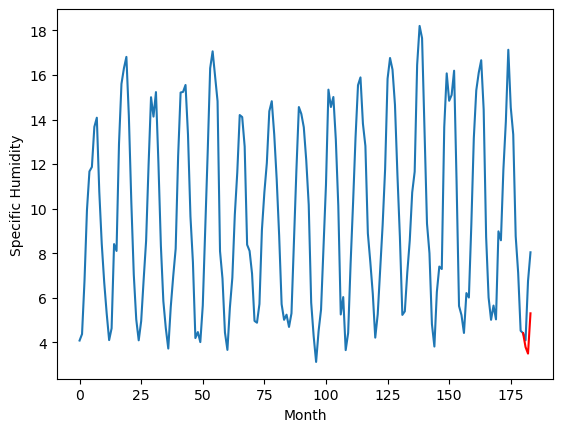

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.35		-0.01
2.91		3.05		0.14
5.49		4.86		-0.63
[180, 181, 182, 183]
[4.29, 3.345633091032505, 3.0531334295868873, 4.860991300642491]


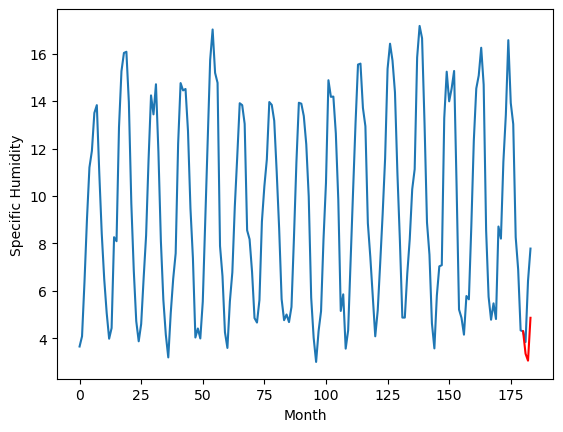

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.89		-0.75
8.00		7.59		-0.41
9.49		9.40		-0.09
[180, 181, 182, 183]
[3.47, 7.885632126182318, 7.59312471613288, 9.400941936820747]


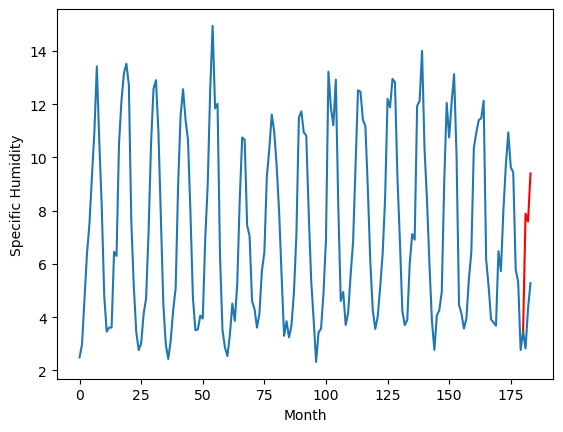

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.87		0.07
6.05		5.57		-0.48
7.76		7.38		-0.38
[180, 181, 182, 183]
[4.52, 5.865617623627186, 5.573116501867771, 7.380939563810825]


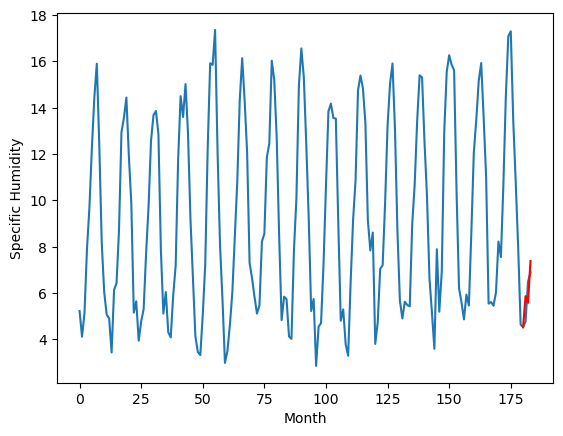

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		4.03		0.10
3.30		3.73		0.43
5.67		5.54		-0.13
[180, 181, 182, 183]
[3.4, 4.025622455328703, 3.733129082173109, 5.540998516529799]


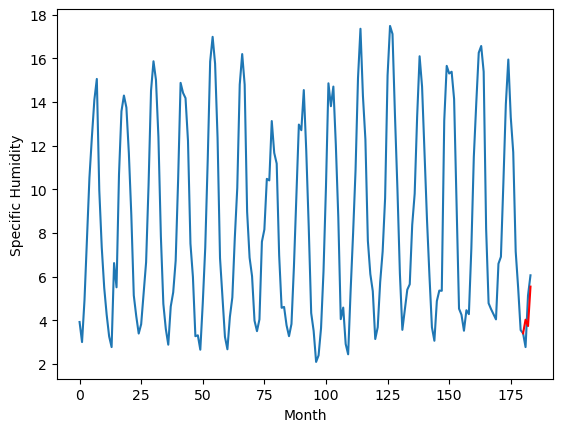

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.60		0.30
2.73		3.30		0.57
4.67		5.11		0.44
[180, 181, 182, 183]
[2.82, 3.5956069879233836, 3.3031165055930614, 5.110977237671614]


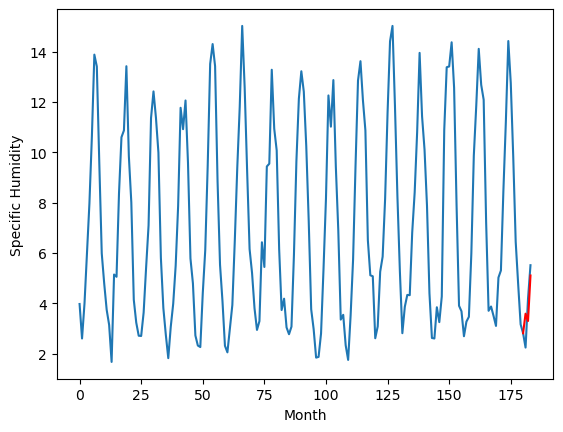

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.44		0.27
1.53		2.14		0.61
3.90		3.95		0.05
[180, 181, 182, 183]
[2.86, 2.4356127882003786, 2.143119891881943, 3.950986465215683]


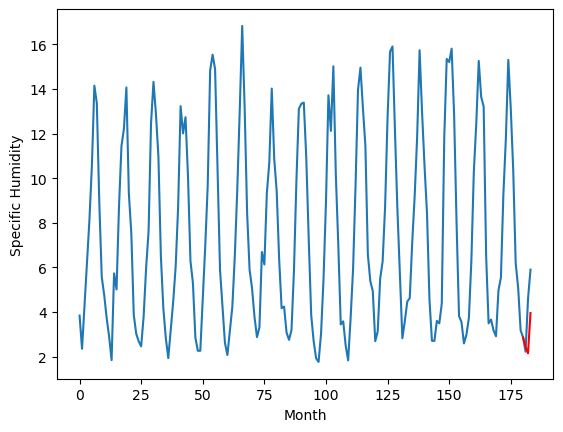

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.17		0.33
4.27		4.87		0.60
5.56		6.68		1.12
[180, 181, 182, 183]
[2.61, 5.165597320795059, 4.873100073337555, 6.68093088388443]


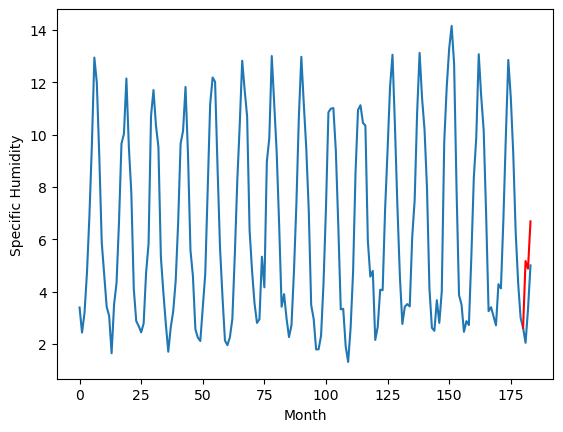

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.165618588477373, 3.8656340596079826, 3.9256272907555103, 3.78563502445817, 3.345633091032505, 7.885632126182318, 5.865617623627186, 4.025622455328703, 3.5956069879233836, 2.4356127882003786, 5.165597320795059]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.165619
1                 1    4.27   3.865634
2                 2    3.87   3.925627
3                 3    3.73   3.785635
4                 4    3.36   3.345633
5                 5    8.64   7.885632
6                 6    5.80   5.865618
7                 7    3.93   4.025622
8                 8    3.30   3.595607
9                 9    2.17   2.435613
10               10    4.84   5.165597


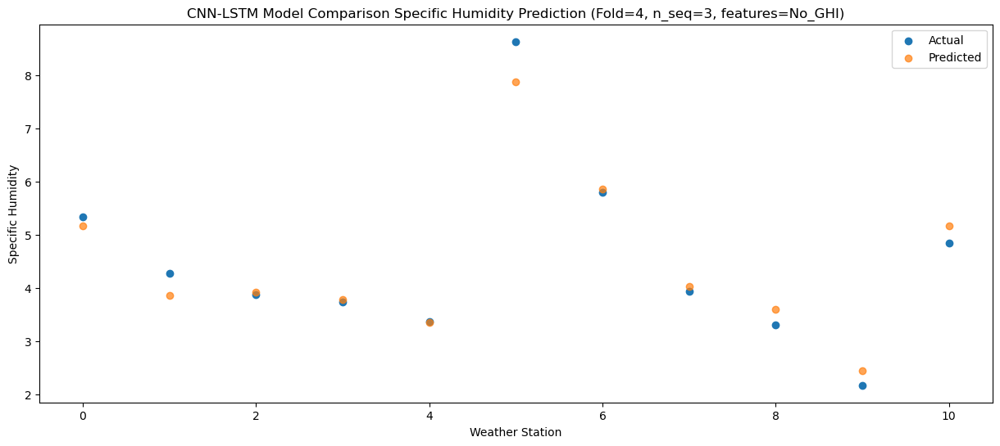

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.873122
1                 1    6.26   3.573123
2                 2    3.75   3.633132
3                 3    3.41   3.493137
4                 4    2.91   3.053133
5                 5    8.00   7.593125
6                 6    6.05   5.573117
7                 7    3.30   3.733129
8                 8    2.73   3.303117
9                 9    1.53   2.143120
10               10    4.27   4.873100


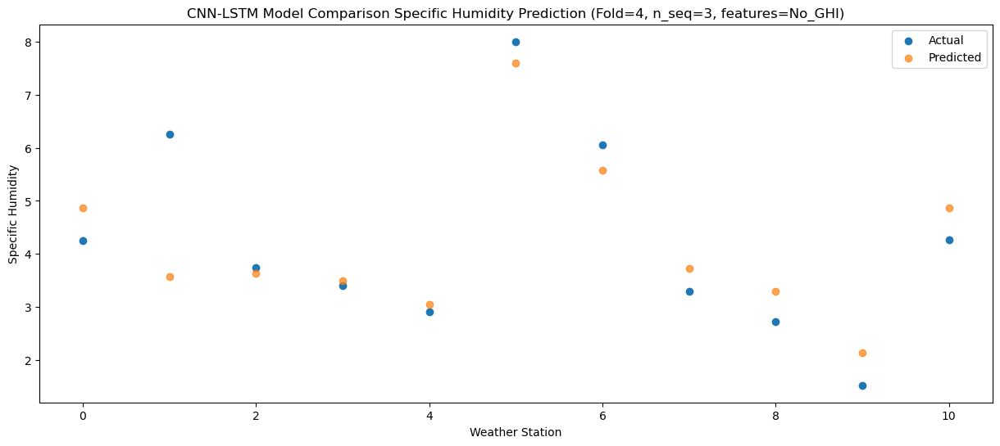

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.680989
1                 1    6.23   5.380923
2                 2    6.81   5.440995
3                 3    6.07   5.301006
4                 4    5.49   4.860991
5                 5    9.49   9.400942
6                 6    7.76   7.380940
7                 7    5.67   5.540999
8                 8    4.67   5.110977
9                 9    3.90   3.950986
10               10    5.56   6.680931


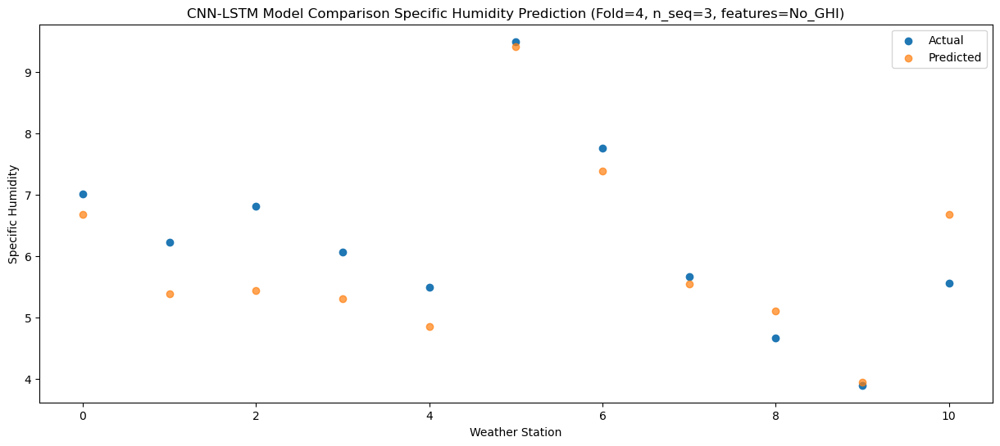

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 1, 512)           0         
 1D)                                                             
                                                                 
 dropout_27 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_18 (LSTM)              (None, 1, 1024)           6295552   
                                                                 
 dropout_28 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_19 (LSTM)              (None, 1024)              8392704   
                                                      

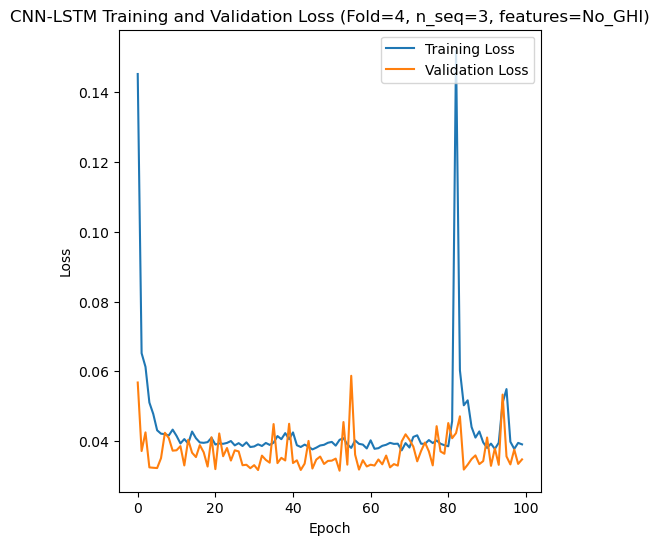

[[0.30298812620099674, 0.6188776288115659, 1.2580063814756808], [0.3891916445373361, 0.7225995231750231, 1.3659570278842808], [0.5888939649318597, 1.2523959819358284, 1.1334704457320037], [0.5909256649859523, 0.7708669493159709, 0.6344476071553347], [0.3084837148119077, 0.9193534933369111, 0.6949273466325558]]
[[0.2229532132365484, 0.4967516020888627, 1.029138951613144], [0.29331422505053645, 0.5982091633569113, 1.2160378077084373], [0.49870722868225775, 0.8704487602277233, 0.9403446655923667], [0.45701647259972306, 0.5952273696119134, 0.5373923889073459], [0.22789105688983735, 0.6144874200224876, 0.5595554823767057]]
[[0.0432551293813236, 0.10539931114502532, 0.14025484022993975], [0.07093234048985884, 0.14334744330802943, 0.18886328065166272], [0.10849065019386911, 0.15808697946571876, 0.15630854468623312], [0.13739836425213425, 0.1632819218897947, 0.127791660812622], [0.05119350238317901, 0.15394570453623352, 0.0923276523150001]]
[[0.9163119269706466, 0.7774079627753473, -0.45188188

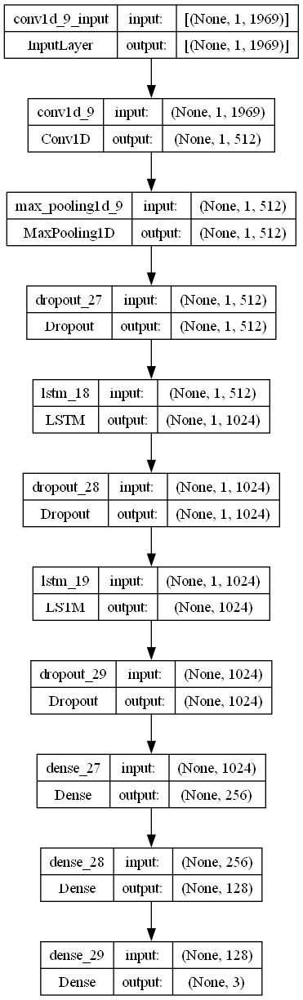

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.0012156900702059202
    optimizer = Adam(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 1024
    dropout_rate = 0.12715922972200197

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S3_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)